## 모델링 데이터 EDA

In [4]:
import pandas as pd
import warnings
import pymysql
from sqlalchemy.orm import sessionmaker
from sqlalchemy import create_engine
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import matplotlib.font_manager as fm
from matplotlib import font_manager, rc
warnings.filterwarnings("ignore", category=FutureWarning)


# 한글 폰트 설정
# font_path = 'C:\Windows\Fonts\malgun.ttf'
# font_name = font_manager.FontProperties(fname=font_path).get_name()
# rc('font', family=font_name)

plt.style.use ('ggplot')
# plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['font.family'] = 'AppleGothic'
plt.rcParams['font.size'] = 7.5
plt.rcParams['axes.unicode_minus'] = False
# pd.set_option('display.max_columns', 100)
# pd.set_option('display.max_rows', 100)

In [5]:
cnx = pymysql.connect(
    user="multi",
    password="*****!",
    host="ec2-15-152-211-160.ap-northeast-3.compute.amazonaws.com",
    database="Data_Mart",
)

query = "SELECT * FROM Data_Warehouse.credit_analysis_model_a;"
model_a = pd.read_sql(query, cnx) 

query = "SELECT * FROM Data_Warehouse.credit_analysis_model_b;"
model_b = pd.read_sql(query, cnx) 

query = "SELECT * FROM Data_Mart.investment_data_web;"
growth_data = pd.read_sql(query, cnx) 

cnx.close()

/var/folders/_r/qrlg6jnd1l5b_xdkq486q0zr0000gn/T/ipykernel_4319/1319013966.py:9: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  model_a = pd.read_sql(query, cnx)
/var/folders/_r/qrlg6jnd1l5b_xdkq486q0zr0000gn/T/ipykernel_4319/1319013966.py:12: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  model_b = pd.read_sql(query, cnx)
/var/folders/_r/qrlg6jnd1l5b_xdkq486q0zr0000gn/T/ipykernel_4319/1319013966.py:15: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  growth_data = pd.read_sql(query, cnx)


### 극단값/이상치 제거: model.describe() 봐서 판단하면서 제거
1. 컬럼별 극단값 0.001% 제거할 예정 (상위 3개 하위 3개) - 하지만 제거 안해도 될 값은 안 하는 게 좋음 
2. 비율 볼 때 극단치 제거가 목표!! 예: ebitda_margin == -12526.985 
3. 일반 계정은 제거 안 하는 게 좋음. 예: 매출액 / 매출원가 / EBITDA 등등 -> 제거하면 삼성전자 / SK / 현대자동차 같은 대기업 당연하게 제거됨 
   - 비율만 제거! 
4. 경제 지표 / 기업 리뷰 데이터 제거 안 함 
5. 하위 값 0.001% 음수인 경우만 제거 - 양수면 제거 안 함 (0에 제일 가까운 값 제거 할 필요 X)

In [6]:
model_a.describe()

,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,ebit_margin,...,rating,paywellfare,worklifebal,culture,opportunity,manager,recommend,ceo,potential,crb_index_avg
count,3097.000000,3.097000e+03,3097.000000,3097.000000,3097.000000,3.097000e+03,3.097000e+03,3.097000e+03,3.097000e+03,3097.000000,...,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000
mean,-1.880449,4.365397e+03,154.386915,6.371409,293.794768,3.603240e+12,2.803462e+12,4.231992e+11,2.152122e+11,-3.005391,...,2.825131,2.784634,3.006500,2.594659,2.679684,2.239396,1.290491,1.316422,1.187091,214.687310
std,227.741663,7.610023e+04,2118.955225,17.407209,6516.216397,1.427841e+13,1.056336e+13,2.586860e+12,2.128457e+12,227.742018,...,0.503111,0.619845,0.592226,0.479991,0.402268,0.422921,0.690566,0.667644,0.691573,50.326558
min,-12526.985234,-1.312671e+05,-69030.671662,-77.763936,-161584.721567,1.747813e+08,0.000000e+00,5.417029e+06,-3.384362e+13,-12526.985234,...,0.060000,0.030000,0.030000,0.090000,0.090000,0.060000,0.060000,0.060000,0.060000,157.422309
25%,0.676412,1.251724e+01,46.899023,-5.569253,-138.864403,2.266950e+11,1.456726e+11,2.155040e+10,6.506744e+08,0.188277,...,2.500000,2.350000,2.640000,2.260000,2.440000,1.970000,0.750000,0.810000,0.660000,187.793544
50%,4.674863,2.783991e+02,94.395239,4.542857,19.210817,6.383948e+11,4.672618e+11,6.057857e+10,2.063504e+10,3.721099,...,2.820000,2.760000,3.000000,2.560000,2.690000,2.220000,1.260000,1.290000,1.140000,198.613552
75%,9.206972,9.202511e+02,167.503186,18.145847,304.107148,1.912956e+12,1.373570e+12,1.852827e+11,9.070067e+10,8.031722,...,3.140000,3.200000,3.400000,2.900000,2.930000,2.460000,1.740000,1.760000,1.600000,222.124992
max,428.093799,3.702125e+06,44925.920242,86.625927,203148.303828,3.022314e+14,1.900418e+14,6.881296e+13,6.115996e+13,428.093799,...,5.000000,5.000000,5.000000,4.290000,4.130000,4.140000,4.070000,4.070000,4.070000,304.641558


In [7]:
model_b.describe()

,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,ebit_margin,...,enterprise_value_to_ebitda,operating_income,net_income,tangible_assets,total_asset_turnover,net_working_capital_turnover,tangible_asset_turnover,accounts_receivable_turnover,inventory_turnover,accounts_payable_turnover
count,3097.000000,3.097000e+03,3097.000000,3097.000000,3097.000000,3.097000e+03,3.097000e+03,3.097000e+03,3.097000e+03,3097.000000,...,3097.000000,3.097000e+03,3.097000e+03,3.097000e+03,3097.000000,3097.000000,3097.000000,3.097000e+03,3.097000e+03,3.097000e+03
mean,-1.880449,4.365397e+03,154.386915,6.371409,293.794768,3.603240e+12,2.803462e+12,4.231992e+11,2.152122e+11,-3.005391,...,-41.247671,3.772247e+11,1.715484e+11,1.805035e+12,88.206199,297.300169,817.109751,2.229752e+03,1.723185e+04,9.554497e+03
std,227.741663,7.610023e+04,2118.955225,17.407209,6516.216397,1.427841e+13,1.056336e+13,2.586860e+12,2.128457e+12,227.742018,...,3079.899636,2.436230e+12,1.780095e+12,9.624612e+12,50.588410,19474.702664,3411.567246,3.799371e+04,2.892795e+05,2.266200e+05
min,-12526.985234,-1.312671e+05,-69030.671662,-77.763936,-161584.721567,1.747813e+08,0.000000e+00,5.417029e+06,-3.384362e+13,-12526.985234,...,-154916.970999,-3.265515e+13,-2.442911e+13,3.167162e+07,1.150083,-745468.147137,1.737281,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.676412,1.251724e+01,46.899023,-5.569253,-138.864403,2.266950e+11,1.456726e+11,2.155040e+10,6.506744e+08,0.188277,...,0.985517,4.477122e+09,-7.064524e+08,7.335120e+10,55.435128,-173.883564,170.308809,4.830736e+02,3.298921e+02,4.959986e+02
50%,4.674863,2.783991e+02,94.395239,4.542857,19.210817,6.383948e+11,4.672618e+11,6.057857e+10,2.063504e+10,3.721099,...,6.809309,2.819982e+10,1.538463e+10,2.352273e+11,79.947860,287.029171,272.436662,6.540571e+02,5.683296e+02,7.355954e+02
75%,9.206972,9.202511e+02,167.503186,18.145847,304.107148,1.912956e+12,1.373570e+12,1.852827e+11,9.070067e+10,8.031722,...,15.135125,1.216791e+11,6.945519e+10,6.886325e+11,110.087748,697.769281,469.245780,9.099626e+02,1.021724e+03,1.088273e+03
max,428.093799,3.702125e+06,44925.920242,86.625927,203148.303828,3.022314e+14,1.900418e+14,6.881296e+13,6.115996e+13,428.093799,...,33428.436857,5.888667e+13,5.565408e+13,1.778653e+14,429.259880,369707.391440,100701.700461,1.813546e+06,8.433314e+06,8.261546e+06


In [8]:
model_a_filter = ['ebitda_margin', 'ebitda_to_interest_expense', 'debt_ratio', 'dependence_on_net_borrowings', 'net_borrowings_to_ebitda', 'ebit_margin', 'ebitda_to_sales_revenue',
                  'borrowing_dependency', 'total_borrowings_to_ebitda', 'debt_to_net_income_ratio', 'total_assets_leverage', 'current_liabilities_ratio',
                  'quick_ratio', 'days_sales_outstanding']

investment_data_filter = ['return_on_equity', 'return_on_invested_capital', 'current_ratio', 'non_current_debt_ratio', 'equity_ratio', 'interest_coverage_ratio',
                  'debt_to_equity_ratio', 'retention_ratio', 'earnings_per_share', 'book_value_per_share', 'price_earnings_ratio', 'price_to_book_ratio',
                  'price_cash_flow_ratio', 'enterprise_value_to_ebitda', 'net_working_capital_turnover', 'tangible_asset_turnover', 'accounts_receivable_turnover',
                  'inventory_turnover', 'accounts_payable_turnover']

model_b_filter = model_a_filter + investment_data_filter

In [9]:
def process_model(model, model_filter, model_name):
    model_processed = model.copy()

    indices_to_drop = set()
    causes = {}

    for col in model_filter:
        sorted_col = model_processed[col].sort_values()

        top3_indices = sorted_col[-3:].index.tolist()
        bottom3_indices = sorted_col[:3].index.tolist() if sorted_col[:3].min() < 0 else []

        for idx in top3_indices + bottom3_indices:
            indices_to_drop.add(idx)
            corp_name = model_processed.loc[idx, 'corp']  # Get the 'corp' name
            if corp_name not in causes:
                causes[corp_name] = []
            causes[corp_name].append(col)


    model_processed = model_processed.drop(indices_to_drop)

    model_processed.reset_index(drop=True, inplace=True)

    model_with_y = model_processed[model_processed['rank'].notna()].reset_index(drop=True)
    model_without_y = model_processed[model_processed['rank'].isna()].reset_index(drop=True)

    print(f"{model_name} original shape: {model.shape}")
    print(f"{model_name} processed shape: {model_processed.shape}")
    print(f"{model_name} with y shape: {model_with_y.shape}")
    print(f"{model_name} without y shape: {model_without_y.shape}")
    print()
    
    return model_processed, model_with_y, model_without_y, causes

credit_model_a, model_a_with_y, model_a_without_y, causes_a = process_model(model_a, model_a_filter, 'model_a')
credit_model_b, model_b_with_y, model_b_without_y, causes_b = process_model(model_b, model_b_filter, 'model_b')

causes_a = str(causes_a).replace('\n', '').replace('  ', ' ')
causes_b = str(causes_b).replace('\n', '').replace('  ', ' ')

model_a original shape: (3097, 56)
model_a processed shape: (3055, 56)
model_a with y shape: (825, 56)
model_a without y shape: (2230, 56)

model_b original shape: (3097, 83)
model_b processed shape: (3002, 83)
model_b with y shape: (813, 83)
model_b without y shape: (2189, 83)



### 극단치 제거한 데이터프레임 MySQL DB에 저장 

In [14]:
from sqlalchemy import create_engine
from sqlalchemy.orm import sessionmaker

username = "multi"
password = "*****!"
hostname = "ec2-15-152-211-160.ap-northeast-3.compute.amazonaws.com"
database_name = "Data_Mart"

engine = create_engine(
    f"mysql+pymysql://{username}:{password}@{hostname}/{database_name}"
)
Session = sessionmaker(bind=engine)

dfs_and_table_names = [(credit_model_a, "credit_model_a"),
                       (credit_model_b, "credit_model_b")]

for df, table_name in dfs_and_table_names:
    try:
        with engine.begin() as connection, Session() as session:
            df.to_sql(
                table_name,
                con=connection,
                if_exists="replace",
                index=False,
                chunksize=1000,
            )
            session.commit()
    except Exception as e:
        print(f"An error occurred while processing table {table_name}: {str(e)}")
        session.rollback()

### 극단값/이상치로 인해 지워진 Row 데이터 확인

In [15]:
causes_a

"{'더메디팜': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue'], '한진칼': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'days_sales_outstanding'], '미래아이앤지': ['ebitda_margin', 'dependence_on_net_borrowings', 'ebit_margin', 'ebitda_to_sales_revenue', 'quick_ratio'], '에스케이바이오팜': ['ebitda_margin', 'ebitda_margin', 'dependence_on_net_borrowings', 'ebit_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'ebitda_to_sales_revenue'], '롯데관광개발': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'current_liabilities_ratio'], '현대퓨처넷': ['ebitda_to_interest_expense', 'ebitda_to_interest_expense'], 'LX홀딩스': ['ebitda_to_interest_expense'], '세우글로벌': ['ebitda_to_interest_expense'], 'HDC랩스': ['ebitda_to_interest_expense'], '오리온': ['ebitda_to_interest_expense'], 'LG헬로비전': ['debt_ratio', 'debt_ratio', 'total_assets_leverage', 'total_assets_leverage', 'total_assets_leverage'], 'KG스틸': ['debt_ratio'], '성안': ['debt_ratio', 'total_assets_leverage'], '에이프로젠': ['debt_ratio', 'dependenc

In [16]:
causes_b

"{'더메디팜': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'tangible_asset_turnover'], '한진칼': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'days_sales_outstanding'], '미래아이앤지': ['ebitda_margin', 'dependence_on_net_borrowings', 'ebit_margin', 'ebitda_to_sales_revenue', 'quick_ratio'], '에스케이바이오팜': ['ebitda_margin', 'ebitda_margin', 'dependence_on_net_borrowings', 'ebit_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'ebitda_to_sales_revenue', 'return_on_invested_capital', 'interest_coverage_ratio', 'earnings_per_share', 'earnings_per_share', 'book_value_per_share'], '롯데관광개발': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'current_liabilities_ratio'], '현대퓨처넷': ['ebitda_to_interest_expense', 'ebitda_to_interest_expense', 'interest_coverage_ratio'], 'LX홀딩스': ['ebitda_to_interest_expense', 'equity_ratio', 'equity_ratio', 'interest_coverage_ratio'], '세우글로벌': ['ebitda_to_interest_expense', 'interest_coverage_ratio'], 'HDC랩스': ['ebitda_to_interest_expen

### 이상치 확인 예시

#### 사례 1: 한진칼

In [17]:
outlier_1 = model_b[model_b['corp']=='한진칼'][['corp', 'sector', 'year', 'ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'days_sales_outstanding']]
outlier_1

,corp,sector,year,ebitda_margin,ebit_margin,ebitda_to_sales_revenue,days_sales_outstanding
2854,한진칼,운수창고업,2018,0.843298,0.622382,0.843298,16.786248
2855,한진칼,운수창고업,2019,-21.704569,-21.896277,-21.704569,17.060260
2856,한진칼,운수창고업,2020,-111.711775,-113.603169,-111.711775,2167.274244
2857,한진칼,운수창고업,2021,52.625361,50.913883,52.625361,41.543728
2858,한진칼,운수창고업,2022,219.721863,218.784199,219.721863,48.639924


#### 이상치 보인 지표 vs 산업 평균 비교 

In [18]:
sector_average = pd.DataFrame(model_b[model_b['sector']=='운수창고업'][['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'days_sales_outstanding']].mean()).T
sector_average

,ebitda_margin,ebit_margin,ebitda_to_sales_revenue,days_sales_outstanding
0,-0.131269,-2.242602,-0.131269,62.771121


#### 사례 2: 에스케이바이오팜

In [19]:
outlier_2 = model_b[model_b['corp']=='에스케이바이오팜'][['corp', 'sector', 'year', 'ebitda_margin', 'ebitda_to_interest_expense', 'ebit_margin', 'ebitda_to_sales_revenue']]
outlier_2

,corp,sector,year,ebitda_margin,ebitda_to_interest_expense,ebit_margin,ebitda_to_sales_revenue
1853,에스케이바이오팜,서비스업,2018,-12526.985234,-17922.685809,-12526.985234,-12526.985234
1854,에스케이바이오팜,서비스업,2019,-68.186856,-2522.019865,-68.186856,-68.186856
1855,에스케이바이오팜,서비스업,2020,-922.762733,-3562.445154,-922.762733,-922.762733
1856,에스케이바이오팜,서비스업,2021,17.025553,739.232899,17.025553,17.025553
1857,에스케이바이오팜,서비스업,2022,-57.872034,-398.703086,-57.872034,-57.872034


#### 이상치 보인 지표 vs 산업 평균 비교 

In [20]:
sector_average = pd.DataFrame(model_b[model_b['sector']=='서비스업'][['ebitda_margin', 'ebitda_to_interest_expense', 'ebit_margin', 'ebitda_to_sales_revenue']].mean()).T
sector_average

,ebitda_margin,ebitda_to_interest_expense,ebit_margin,ebitda_to_sales_revenue
0,-43.030081,2608.565187,-44.507646,-43.030081


### 이상치 처리 후 model.describe()로 비율 봤을 때 비교적 많이 좋아짐 

In [21]:
model_a_processed.describe()

,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,ebit_margin,...,rating,paywellfare,worklifebal,culture,opportunity,manager,recommend,ceo,potential,crb_index_avg
count,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3.055000e+03,3.055000e+03,3.055000e+03,3.055000e+03,3055.000000,...,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000
mean,2.526259,2528.496656,153.664688,6.306604,242.403834,3.616521e+12,2.808765e+12,4.260838e+11,2.184951e+11,1.408054,...,2.827286,2.787313,3.008766,2.595352,2.680340,2.240867,1.292039,1.317836,1.188645,214.728652
std,25.789363,22625.608474,567.036216,17.040087,2706.175925,1.430390e+13,1.055075e+13,2.602640e+12,2.142786e+12,25.991227,...,0.504331,0.620341,0.593761,0.481443,0.403471,0.423924,0.690701,0.667854,0.691347,50.284037
min,-462.753943,-16484.118951,-1972.674000,-52.805216,-33610.096861,1.747813e+08,0.000000e+00,5.417029e+06,-3.384362e+13,-462.753943,...,0.060000,0.030000,0.030000,0.090000,0.090000,0.060000,0.060000,0.060000,0.060000,157.422309
25%,0.759759,18.035064,46.960861,-5.550914,-137.924475,2.324546e+11,1.482674e+11,2.186051e+10,1.062087e+09,0.289143,...,2.500000,2.360000,2.640000,2.260000,2.440000,1.970000,0.760000,0.810000,0.660000,187.793544
50%,4.722085,281.622689,93.985036,4.533821,19.811718,6.429327e+11,4.713924e+11,6.077339e+10,2.085660e+10,3.738415,...,2.820000,2.760000,3.000000,2.560000,2.690000,2.220000,1.260000,1.290000,1.140000,198.613552
75%,9.187785,926.874186,166.351754,17.983478,302.096254,1.934438e+12,1.376169e+12,1.861527e+11,9.292273e+10,8.031456,...,3.150000,3.210000,3.400000,2.900000,2.930000,2.470000,1.740000,1.760000,1.610000,222.124992
max,134.869918,861463.157895,21990.897550,65.214990,55174.146441,3.022314e+14,1.900418e+14,6.881296e+13,6.115996e+13,134.869918,...,5.000000,5.000000,5.000000,4.290000,4.130000,4.140000,4.070000,4.070000,4.070000,304.641558


In [22]:
model_b_processed.describe()

,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,ebit_margin,...,enterprise_value_to_ebitda,operating_income,net_income,tangible_assets,total_asset_turnover,net_working_capital_turnover,tangible_asset_turnover,accounts_receivable_turnover,inventory_turnover,accounts_payable_turnover
count,3002.000000,3002.000000,3002.000000,3002.000000,3002.000000,3.002000e+03,3.002000e+03,3.002000e+03,3.002000e+03,3002.000000,...,3002.000000,3.002000e+03,3.002000e+03,3.002000e+03,3002.000000,3002.000000,3002.000000,3002.000000,3.002000e+03,3.002000e+03
mean,2.823880,2262.107419,141.888213,6.311653,244.692303,3.658036e+12,2.841215e+12,4.305965e+11,2.211612e+11,1.727476,...,10.014794,3.851645e+11,1.770905e+11,1.831887e+12,88.829285,412.401298,748.910797,1134.337518,8.781876e+03,2.772771e+03
std,24.758438,16563.321324,375.345636,16.979193,2700.994524,1.441562e+13,1.063192e+13,2.623779e+12,2.161192e+12,24.750671,...,410.965715,2.473248e+12,1.807306e+12,9.736968e+12,50.446560,7187.356919,2562.518510,6225.924335,1.474244e+05,5.217106e+04
min,-462.753943,-16484.118951,-1972.674000,-52.805216,-33610.096861,1.929475e+08,0.000000e+00,5.417029e+06,-3.384362e+13,-462.753943,...,-11877.378372,-3.265515e+13,-2.442911e+13,3.167162e+07,3.929867,-144926.620874,7.341838,0.000000,0.000000e+00,0.000000e+00
25%,0.843980,24.328567,46.933044,-5.546896,-137.250694,2.362158e+11,1.538900e+11,2.223302e+10,1.362193e+09,0.368940,...,1.191116,4.887897e+09,7.525210e+07,7.604742e+10,55.886407,-160.881312,170.635055,483.118227,3.314207e+02,4.992255e+02
50%,4.762735,286.254269,93.884608,4.516449,20.184629,6.503766e+11,4.751112e+11,6.145428e+10,2.116734e+10,3.765967,...,6.881745,2.875245e+10,1.605784e+10,2.378844e+11,80.410801,294.813457,272.016082,653.374827,5.686006e+02,7.360886e+02
75%,9.249765,936.498211,165.561571,17.966122,303.683900,1.968539e+12,1.390219e+12,1.891249e+11,9.375196e+10,8.042884,...,15.152634,1.223185e+11,7.109375e+10,6.951194e+11,110.474860,707.946152,464.143546,907.422344,1.006821e+03,1.088366e+03
max,134.869918,538558.250756,18248.773301,65.214990,55174.146441,3.022314e+14,1.900418e+14,6.881296e+13,6.115996e+13,134.869918,...,10834.134029,5.888667e+13,5.565408e+13,1.778653e+14,429.259880,107520.579690,45549.873906,229190.532042,6.411742e+06,1.986368e+06


## 테이블 전처리

In [23]:
model_b_processed['rank'].isnull().sum()

2189

### rank의 널값이 많은 상황, 케이스에 따라 세가지 테이블 생성

In [24]:
# rank의 널값이 많은 상황, 케이스에 따라 세가지 테이블 생성

raw_data = model_b_processed.copy()
data_without_rank = raw_data.drop(['rank'], axis = 1)
data_with_rank = raw_data.copy().dropna()

In [25]:
print(raw_data.shape)
print(data_without_rank.shape)
print(data_with_rank.shape)

(3002, 83)
(3002, 82)
(813, 83)


## 전체 데이터 셋 eda
- data_without_rank 사용
- data_without_rank 는 eda를 위해 널값이 많은 rank 칼럼만 드랍 (사실상 전체 데이터셋으로 봐도 무방)
  
- rank가 없는 데이터를 포함하는 경우 기업의 전반적인 재무정보에 대한 분포 확인 등 rank 데이터가 필요없는 EDA를 진행
- rank가 있는 데이터의 경우 다른 컬럼과 rank와의 상관관계 등 목표변수와 관련된 eda를 진행

---

삼성전자 매출액: 302231360000000.0


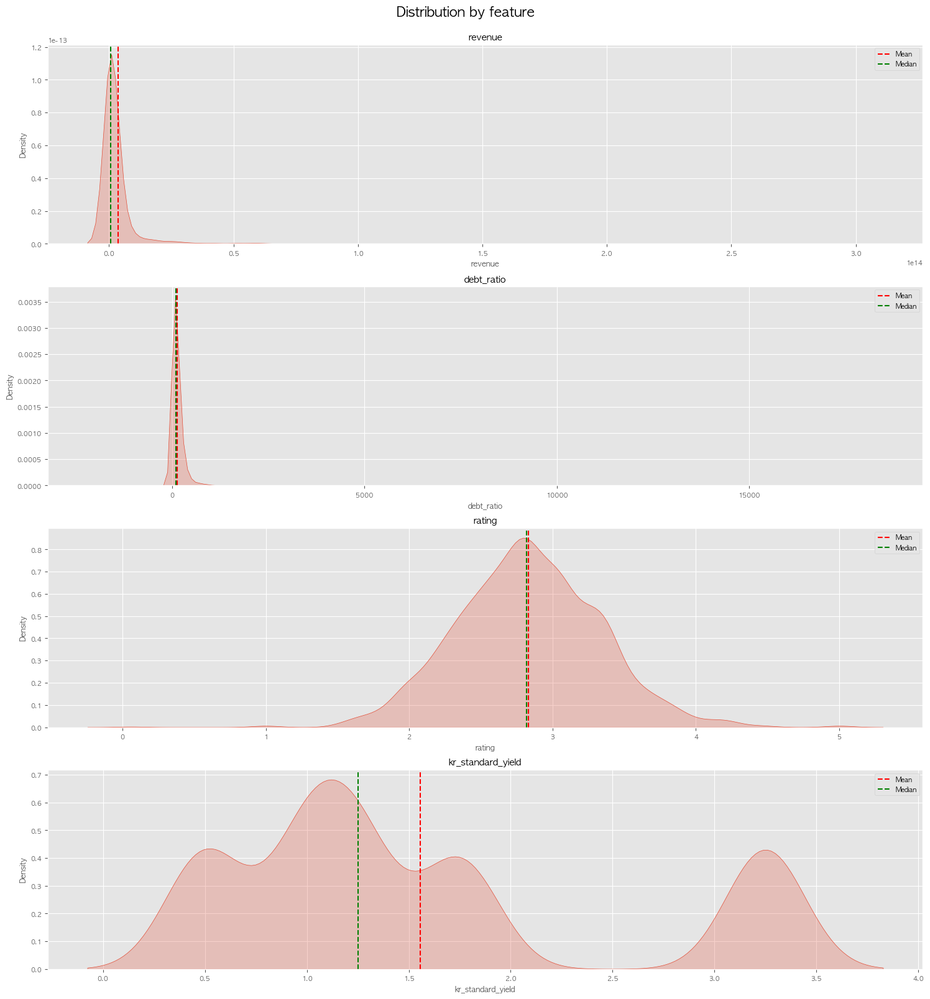

In [26]:
# 칼럼별 데이터 분포 확인
columns_to_plot = ['revenue', 'debt_ratio', 'rating', 'kr_standard_yield']

num_rows = len(columns_to_plot)

fig, axes = plt.subplots(nrows=num_rows, figsize=(15, 4*num_rows))
fig.suptitle('Distribution by feature', y=1, fontsize=16)

for i, column in enumerate(columns_to_plot):
    sns.kdeplot(data_without_rank[column], fill=True, ax=axes[i])

    mean_value = data_without_rank[column].mean()
    median_value = data_without_rank[column].median()

    axes[i].axvline(mean_value, color='r', linestyle='--', label='Mean')
    axes[i].axvline(median_value, color='g', linestyle='--', label='Median')

    axes[i].set_title(column)

    axes[i].legend()
    
    if column == 'revenue':
        print(f"삼성전자 매출액: {data_without_rank[data_without_rank['corp']=='삼성전자']['revenue'].max()}")

plt.tight_layout()
plt.show()

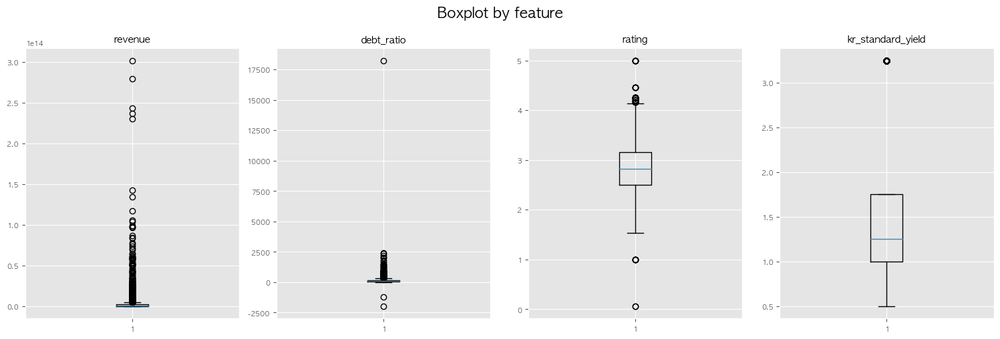

In [27]:
# 칼럼별 박스 플랏 확인
columns_to_plot = ['revenue', 'debt_ratio', 'rating', 'kr_standard_yield']

num_columns = 4
num_rows = (len(columns_to_plot) - 4) // num_columns + 1

fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(15, 5*num_rows))

axes = axes.flatten()

for i, column in enumerate(columns_to_plot):
    axes[i].boxplot(data_without_rank[column])
    axes[i].set_title(column)
    
fig.suptitle('Boxplot by feature', y=1, fontsize=16)

for j in range(len(data_without_rank.columns[4:]), num_rows * num_columns):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

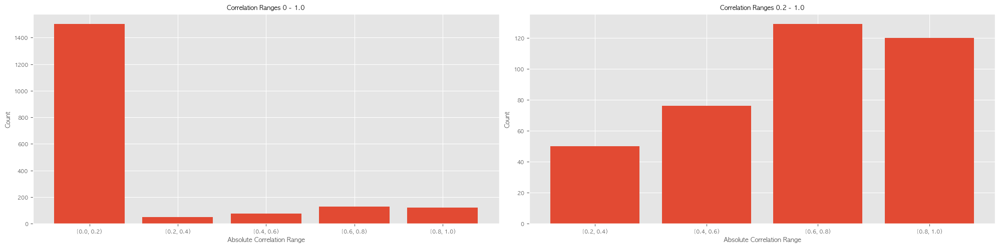

,Bin Range,Feature 1,Feature 2,Correlation Value
0,"[0, 0.2)",ebitda_margin,ebitda_to_interest_expense,0.081753
1,"[0, 0.2)",debt_ratio,ebitda_margin,-0.087000
2,"[0, 0.2)",dependence_on_net_borrowings,ebitda_margin,-0.046474
3,"[0, 0.2)",ebitda_margin,net_borrowings_to_ebitda,0.004192
4,"[0, 0.2)",ebitda_margin,revenue,0.045721
5,"[0.2, 0.4)",ebitda_margin,operating_profit_margin,0.335123
6,"[0.2, 0.4)",ebitda_margin,return_on_invested_capital,0.389590
7,"[0.2, 0.4)",ebitda_to_interest_expense,quick_ratio,0.258281
8,"[0.2, 0.4)",current_ratio,ebitda_to_interest_expense,0.251628
9,"[0.2, 0.4)",debt_ratio,equity_ratio,-0.360709


In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def compute_correlation_pairs(data):
    correlation_matrix = data.corr()
    
    correlation_pairs = []
    for col in correlation_matrix.columns:
        for idx in correlation_matrix.index:
            correlation_value = correlation_matrix.at[idx, col]
            if not np.isnan(correlation_value):
                feature1, feature2 = sorted([idx, col])
                correlation_pairs.append({
                    "Feature 1": feature1,
                    "Feature 2": feature2,
                    "Correlation Value": correlation_value
                })

    correlation_df = pd.DataFrame(correlation_pairs)
    correlation_df['Feature Pair'] = correlation_df.apply(
        lambda row: tuple(sorted([row['Feature 1'], row['Feature 2']])), axis=1
    )
    
    correlation_df = correlation_df.drop_duplicates(subset='Feature Pair')
    correlation_df['Absolute Correlation'] = abs(correlation_df['Correlation Value'])
    
    return correlation_df


def plot_correlations(correlation_df, bins_list):
    fig, axes = plt.subplots(1, len(bins_list), figsize=(10 * len(bins_list), 5))

    for ax, bins in zip(axes, bins_list):
        binned_correlation = pd.cut(correlation_df['Correlation Value'], bins=bins, right=False)
        correlation_counts = binned_correlation.value_counts().sort_index()
        ax.bar(correlation_counts.index.astype(str), correlation_counts.values)
        ax.set_xlabel('Absolute Correlation Range')
        ax.set_ylabel('Count')
        ax.set_title(f'Correlation Ranges {bins[0]} - {bins[-1]}', fontsize=9)
    
    plt.tight_layout()
    plt.show()


def get_top_correlations(correlation_df, bins, n=5):
    results_df = pd.DataFrame(columns=['Bin Range', 'Feature 1', 'Feature 2', 'Correlation Value'])

    for i in range(len(bins) - 1):
        bin_range = f'[{bins[i]}, {bins[i+1]})'
        bin_filtered = correlation_df.loc[
            (correlation_df['Absolute Correlation'] >= bins[i]) &
            (correlation_df['Absolute Correlation'] < bins[i+1])
        ]

        top_pairs = bin_filtered[['Feature 1', 'Feature 2', 'Correlation Value']].head(n)
        top_pairs['Bin Range'] = bin_range
        results_df = results_df.append(top_pairs)

    results_df = results_df.reset_index(drop=True)
    results_df = results_df[['Bin Range', 'Feature 1', 'Feature 2', 'Correlation Value']]
    
    return results_df

correlation_df = compute_correlation_pairs(data_without_rank)
plot_correlations(correlation_df, [[0, 0.2, 0.4, 0.6, 0.8, 1.0], [0.2, 0.4, 0.6, 0.8, 1.0]])
top_corr_df = get_top_correlations(correlation_df, [0, 0.2, 0.4, 0.6, 0.8, 1.0])

top_corr_df

상관관계 0.6~0.8사이 의외의 변수 조합 찾아보았으나 기업 리뷰의 개수가 매출액 등 기업 규모와 관련 있는 피쳐와 높은 상관관계를 보였고

그 외의 변수조합에서는 예상한 결과를 보였다

### 

## 시가총액에 큰 영향을 미치는 변수들은 무엇일까?

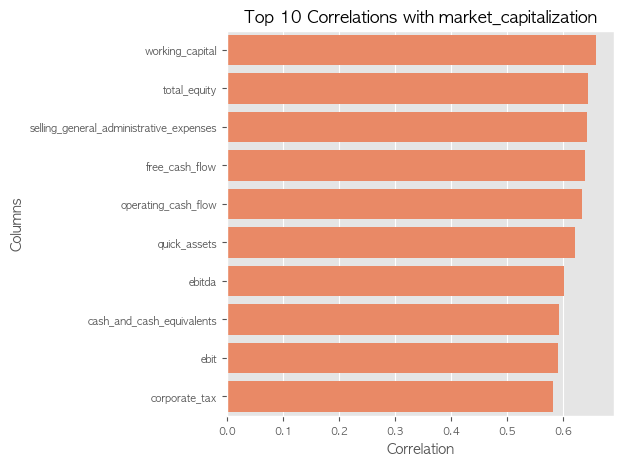

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

market_capitalization_correlation = data_without_rank.iloc[:, 5:].corrwith(data_without_rank['market_capitalization']).drop('market_capitalization')

top_10_correlation = market_capitalization_correlation.abs().sort_values(ascending=False).head(10)
top_10_correlation = market_capitalization_correlation[top_10_correlation.index]

plt.figure(figsize=(5, 5))
sns.barplot(x=top_10_correlation.values, y=top_10_correlation.index, orient='h', color='Coral')
plt.title('Top 10 Correlations with market_capitalization', fontsize=12)
plt.xlabel('Correlation', fontsize=10)
plt.ylabel('Columns', fontsize=10)
plt.show()

In [30]:
top_10_correlation

working_capital                            0.657944
total_equity                               0.644637
selling_general_administrative_expenses    0.642368
free_cash_flow                             0.639101
operating_cash_flow                        0.633753
quick_assets                               0.620555
ebitda                                     0.601167
cash_and_cash_equivalents                  0.592212
ebit                                       0.589755
corporate_tax                              0.580731
dtype: float64

시가총액은 기업의 가치가 아니라 기업의 주식의 가치이기 때문에 돈과 관련된 피쳐가 상관관계가 높다고 판단
- 기업의 유동성을 대표하는 운전자본이 높다는 것은 기업이 영업활동을 통해 많은 수익을 창출하여 가용 가능한 자본의 크기가 크다는 것을 의미
- 이 지표는 기업의 유동성과 수익성을 함의하고 있으므로 시가총액에 영향을 준 것으로 사료됨 

In [31]:
# 상관관계가 높은 상위 5개의 칼럼 추출
top_5_columns = market_capitalization_correlation.nlargest(5)
bot_5_columns = market_capitalization_correlation.nsmallest(5)

# 결과 출력
print("● 시가총액과 양의 상관관계 피쳐 Top 5: ●")
for column, correlation in top_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")
    
print('')
print("● 시가총액과 음의 상관관계 피쳐 Top 5: ●")
for column, correlation in bot_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")
    
print('')

# 상관계수가 0.5~ 0.8 사이에 있는 피쳐 확인 해보기
filtered_columns = market_capitalization_correlation[(market_capitalization_correlation >= 0.5) & (market_capitalization_correlation <= 0.8)]
filtered_columns_sorted = filtered_columns.sort_values(ascending=False)
print("● 0.5 ~ 0.8 에 위치해 있는 상관계수: ●")
for column, correlation in filtered_columns_sorted.items():
    print(f"{column}: {np.round(correlation, 2)}")

● 시가총액과 양의 상관관계 피쳐 Top 5: ●
working_capital 0.66
total_equity 0.64
selling_general_administrative_expenses 0.64
free_cash_flow 0.64
operating_cash_flow 0.63

● 시가총액과 음의 상관관계 피쳐 Top 5: ●
net_borrowings -0.11
borrowing_dependency -0.06
total_asset_turnover -0.05
dependence_on_net_borrowings -0.05
current_liabilities_ratio -0.05

● 0.5 ~ 0.8 에 위치해 있는 상관계수: ●
working_capital: 0.66
total_equity: 0.64
selling_general_administrative_expenses: 0.64
free_cash_flow: 0.64
operating_cash_flow: 0.63
quick_assets: 0.62
ebitda: 0.6
cash_and_cash_equivalents: 0.59
ebit: 0.59
corporate_tax: 0.58
net_income: 0.58
revenue: 0.56
total_assets: 0.53
count: 0.51
operating_income: 0.51


## 매출액에 큰 영향을 미치는 변수는 무엇일까?

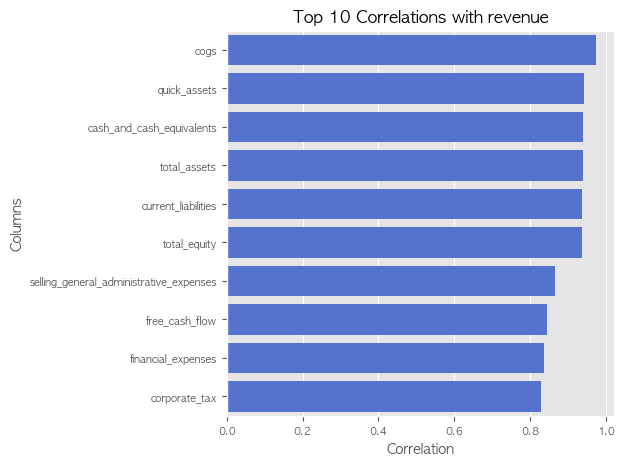

In [32]:
revenue_correlation = data_without_rank.iloc[:, 5:].corrwith(data_without_rank['revenue']).drop('revenue')

top_10_revenue_correlation = revenue_correlation.abs().sort_values(ascending=False).head(10)
top_10_revenue_correlation = revenue_correlation[top_10_revenue_correlation.index]

plt.figure(figsize=(5, 5))
sns.barplot(x=top_10_revenue_correlation.values, y=top_10_revenue_correlation.index, orient='h', color='RoyalBlue')
plt.title('Top 10 Correlations with revenue', fontsize=12)
plt.xlabel('Correlation', fontsize=10)
plt.ylabel('Columns', fontsize=10)
plt.show()


매출액과 직접적인 연관이 있는 매출원가가 가장 높은 상관관계를 보였고
기업규모와 관계가 있는 당좌자산과 현금성자산, 총자산 등이 높은 상관관계를 보였다.

In [33]:
# 상관관계가 높은 상위 5개의 칼럼 추출
top_5_columns = revenue_correlation.nlargest(5)
bot_5_columns = revenue_correlation.nsmallest(5)

# 결과 출력
print("● 매출액과 양의 상관관계 피쳐 Top 5: ●")
for column, correlation in top_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")
    
print('')
print("● 매출액과 음의 상관관계 피쳐 Top 5: ●")
for column, correlation in bot_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")
    
print('')

# 상관계수가 0.5~ 0.8 사이에 있는 피쳐 확인 해보기
filtered_columns = revenue_correlation[(revenue_correlation >= 0.5) & (revenue_correlation <= 0.8)]
filtered_columns_sorted = filtered_columns.sort_values(ascending=False)
print("● 0.5 ~ 0.8 에 위치해 있는 상관계수: ●")
for column, correlation in filtered_columns_sorted.items():
    print(f"{column}: {np.round(correlation, 2)}")

● 매출액과 양의 상관관계 피쳐 Top 5: ●
cogs 0.97
quick_assets 0.94
cash_and_cash_equivalents 0.94
total_assets 0.94
current_liabilities 0.94

● 매출액과 음의 상관관계 피쳐 Top 5: ●
days_sales_outstanding -0.09
equity_ratio -0.05
current_ratio -0.05
quick_ratio -0.04
borrowing_dependency -0.03

● 0.5 ~ 0.8 에 위치해 있는 상관계수: ●
tangible_assets: 0.78
ebit: 0.76
total_liabilities: 0.75
short_term_borrowings: 0.74
net_income: 0.74
count: 0.71
operating_income: 0.68
total_borrowings: 0.56
market_capitalization: 0.56


### 영업이익 성과가 좋은 기업과 좋지 않은 기업의 특징을 비교 (영업이익마진을 기준으로)

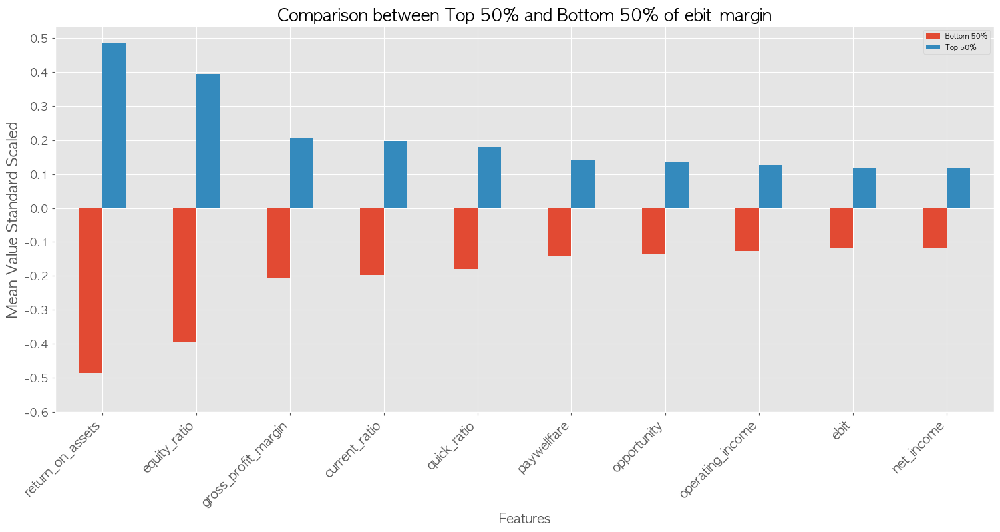

In [94]:
from sklearn.preprocessing import StandardScaler

model_b_drop_columns = model_b.drop(['corp', 'stock_code', 'sector', 'year', 'rank'], axis=1)

scaler = StandardScaler()
model_b_drop_columns_scaled = pd.DataFrame(scaler.fit_transform(model_b_drop_columns), columns=model_b_drop_columns.columns, index=model_b_drop_columns.index)

bottom_50_df = model_b_drop_columns_scaled.loc[bottom_50.index]
top_50_df = model_b_drop_columns_scaled.loc[top_50.index]

bottom_50_means = bottom_50_df.mean()
top_50_means = top_50_df.mean()

difference_in_means = top_50_means - bottom_50_means

top_10_difference_features = difference_in_means.sort_values(ascending=False).head(10).index

plot_df = pd.DataFrame({
    'Bottom 50%': bottom_50_means[top_10_difference_features],
    'Top 50%': top_50_means[top_10_difference_features]
})

plt.figure(figsize=(15, 8))
plot_df.plot(kind='bar', ax=plt.gca())
plt.title('Comparison between Top 50% and Bottom 50% of ebit_margin', fontsize=18)
plt.ylabel('Mean Value Standard Scaled', fontsize=16)
plt.xlabel('Features', fontsize=14)

plt.xticks(rotation=45, fontsize=14, ha='right')

y_ticks_max = max(plot_df['Bottom 50%'].max(), plot_df['Top 50%'].max())
y_ticks_min = min(plot_df['Bottom 50%'].min(), plot_df['Top 50%'].min())
plt.yticks(np.arange(-0.6, 0.6, 0.1), fontsize=12)

plt.tight_layout()
plt.legend(loc='upper right')
plt.show()

### 영업성과에 따른 기업 특징 분석
영업이익률을 기준으로 상위50%와 하위50% 기업 그룹을 분석한 결과, 몇 가지 주요 특징이 보임: 

|주요 특징|설명|
|--|--|
|영업성과|상위 그룹의 기업들은 ROA (자산대비 수익률) 및 매출총이익률에서 눈에 띄게 높은 성과를 보임.<br>해당 기업들이 자산을 효율적으로 활용하여 수익을 창출하고 있으며, 물품이나 서비스를 생산하거나 제공하는 과정에서 더 높은 마진을 얻고 있음 |
|유동성 관리|상위 그룹의 기업들은 유동비율과 당좌비율에서도 높은 수치를 기록했음.<br> 이는 해당 기업들이 단기 채무에 대응할 수 있는 자산을 효과적으로 관리하고 있다는 것을 나타냄. 좋은 유동성 관리는 기업의 재무 안정성을 높이고 위기대응력을 높임|
|직원복지 및 기회 평가|상위 그룹 기업의 직원들은 기업의 복지 및 커리어 기회에 대해 더 높은 만족도를 표현했습니다.<br> 직원들의 높은 만족도는 기업의 생산성 향상, 직원 이탈률 감소 등 다양한 긍정적 효과를 가져올 수 있음 |

<br>결론적으로, 상위 그룹의 기업들은 단순히 영업성과만 뛰어나지 않고, 재무 관리와 직원 만족도라는 다양한 영역에서도 탁월한 성과를 보이고 있음. 이러한 통합적인 관리 능력은 기업의 지속 가능한 성장을 위한 중요한 기반이 될 수 있음 

## data_with_rank
- 신용지표가 존재하는 840개의 기업을 대상으로 EDA

rank 값 수치화

In [34]:
data_with_rank['rank'].unique()

array(['BBB', 'AA-', 'AA', 'A', 'A-', 'A+', 'JB', 'AA+', 'AAA'],
      dtype=object)

In [35]:
# rank 열 값 처리
rank_mapping = {
    None: None,
    'JB': 1,
    'BBB':2,
    'A-': 3,
    'A': 4,
    'A+': 5,
    'AA-': 6,
    'AA': 7,
    'AA+': 8,
    'AAA': 9
}
data_with_rank['rank'] = data_with_rank['rank'].map(rank_mapping)

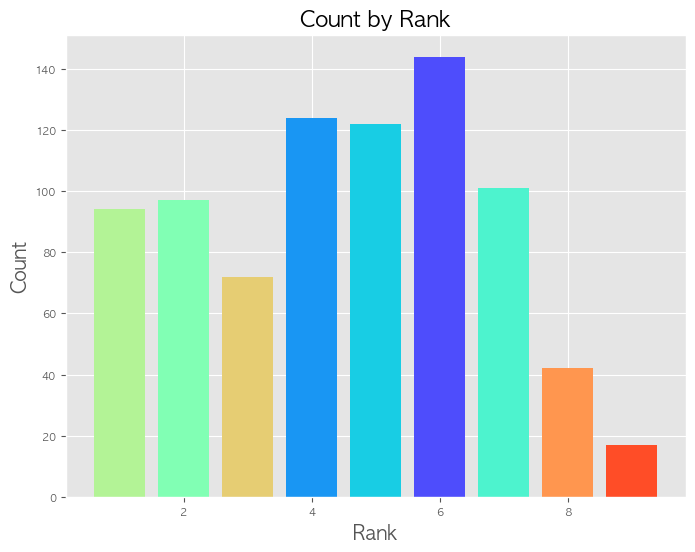

In [36]:
# rank별 카운트 집계
# 'rank' 열별로 개수를 계산
rank_counts = data_with_rank['rank'].value_counts()

# 막대 그래프의 색상을 무지개색으로 지정
colors = sns.color_palette('rainbow', len(rank_counts))

# 바 그래프로 시각화 (색상 변경)
plt.figure(figsize=(8, 6))
plt.bar(rank_counts.index, rank_counts.values, color=colors)
plt.title('Count by Rank', fontsize=16)
plt.xlabel('Rank', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()

In [37]:
# 'year'와 'rank'의 빈도수 계산
rank_counts = data_with_rank.groupby(['year', 'rank']).size().reset_index(name='Count')

# 'year'별 'rank'의 총 개수 계산
year_totals = rank_counts.groupby('year')['Count'].sum().reset_index(name='Total')

# 'rank'의 비율 계산
rank_counts = rank_counts.merge(year_totals, on='year')
rank_counts['Ratio'] = rank_counts['Count'] / rank_counts['Total']

# 'year'별 'rank' 비율 분포를 데이터프레임으로 생성
rank_ratio_df = rank_counts.pivot(index='rank', columns='year', values='Ratio')
rank_ratio_df = rank_ratio_df.reindex()

# 표로 출력
print(rank_ratio_df)

year      2018      2019      2020      2021      2022
rank                                                  
1.0   0.076923  0.142857  0.126437  0.124324  0.100000
2.0   0.115385  0.116883  0.120690  0.113514  0.129412
3.0   0.115385  0.090909  0.080460  0.075676  0.088235
4.0   0.153846  0.155844  0.143678  0.162162  0.147059
5.0   0.138462  0.103896  0.160920  0.162162  0.176471
6.0   0.176923  0.168831  0.172414  0.178378  0.188235
7.0   0.138462  0.142857  0.126437  0.113514  0.105882
8.0   0.061538  0.051948  0.051724  0.048649  0.047059
9.0   0.023077  0.025974  0.017241  0.021622  0.017647


In [38]:
jb_rank = rank_counts[rank_counts['rank'] == 1]
other_ranks = rank_counts[rank_counts['rank'] != 1]

# 'rank'가 'JB'인 데이터와 그 외 데이터를 연도별로 그룹화하여 비율 계산
jb_ratio = jb_rank.groupby('year')['Ratio'].sum().reset_index(name='JB_Ratio')
other_ratio = other_ranks.groupby('year')['Ratio'].sum().reset_index(name='Other_Ratio')

# 'JB_Ratio'와 'Other_Ratio'를 연도를 기준으로 병합
ratio_diff = jb_ratio.merge(other_ratio, on='year')

# 비율 차이 계산
ratio_diff['Ratio_Difference'] = ratio_diff['JB_Ratio'] - ratio_diff['Other_Ratio']

# 결과 출력
print(ratio_diff)


   year  JB_Ratio  Other_Ratio  Ratio_Difference
0  2018  0.076923     0.923077         -0.846154
1  2019  0.142857     0.857143         -0.714286
2  2020  0.126437     0.873563         -0.747126
3  2021  0.124324     0.875676         -0.751351
4  2022  0.100000     0.900000         -0.800000


19년부터 직전년도 대비 2배가까이 JB비율이 증가, 20, 21년까지 기조 유지, 22년에는 18년 수준보다 약간 높은 수치로 복귀


### 각 열에 대해 rank 값에 따른 분포를 boxplot으로 시각화

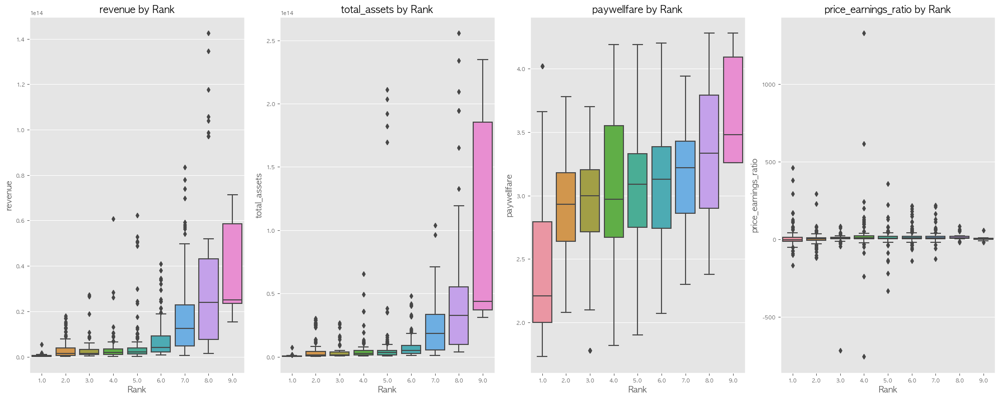

In [39]:
attributes = ['revenue', 'total_assets', 'paywellfare', 'price_earnings_ratio']

fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20, 8))

for idx, attribute in enumerate(attributes):
    ax = axes[idx]
    
    sns.boxplot(x='rank', y=attribute, data=data_with_rank, ax=ax)
    ax.set_title(f'{attribute} by Rank', fontsize=14)
    ax.set_xlabel('Rank', fontsize=12)
    ax.set_ylabel(attribute, fontsize=12)

plt.tight_layout()
plt.show()

## 신용등급에 큰 영향을 미치는 변수는 무엇일까?

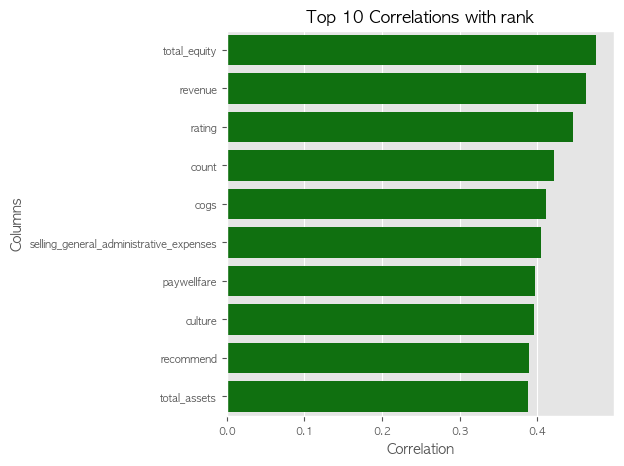

In [40]:
rank_correlation = data_with_rank.iloc[:, 5:].corrwith(data_with_rank['rank']).drop('rank')

top_10_rank_correlation = rank_correlation.abs().sort_values(ascending=False).head(10)
top_10_rank_correlation = rank_correlation[top_10_rank_correlation.index]

plt.figure(figsize=(5, 5))
sns.barplot(x=top_10_rank_correlation.values, y=top_10_rank_correlation.index, orient='h', color='Green')
plt.title('Top 10 Correlations with rank', fontsize=12)
plt.xlabel('Correlation', fontsize=10)
plt.ylabel('Columns', fontsize=10)
plt.show()

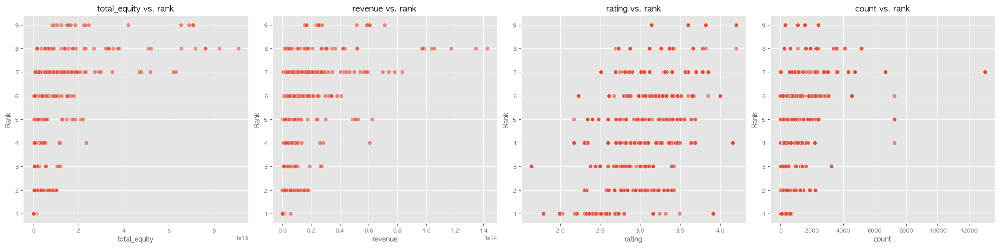

In [43]:
features = ['total_equity', 'revenue', 'rating', 'count']

fig, axes = plt.subplots(nrows=1, ncols=len(features), figsize=(20, 5))

for idx, feature in enumerate(features):
    sns.scatterplot(data=data_with_rank, x=feature, y='rank', alpha=0.6, ax=axes[idx])
    axes[idx].set_title(f'{feature} vs. rank', fontsize=12)
    axes[idx].set_ylabel('Rank', fontsize=10)
    axes[idx].set_xlabel(feature, fontsize=10)

plt.tight_layout()
plt.show()

- 총자본, 매출액과 같은 기업규모와 관련된 컬럼들이 신용등급과 비교적 높은 상관관계를 보임
- 그 다음 기업 별점 데이터와 신용등급과 상관관계가 높은 것으로 나타났는데, 이는 직원들에게 좋은 평가를 받은 회사들이 신용등급이 좋은 경향성을 보였음을 의미



In [99]:
# 상관관계가 높은 상위 5개의 칼럼 추출
top_5_columns = rank_correlation.nlargest(5)
bot_5_columns = rank_correlation.nsmallest(5)

# 결과 출력
print("● 신용등급과 양의 상관관계 피쳐 Top 5: ●")
for column, correlation in top_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")
    
print('')
print("● 신용등급과 음의 상관관계 피쳐 Top 5: ●")
for column, correlation in bot_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")

print('')
    
# 상관계수가 0.5~ 0.8 사이에 있는 피쳐 확인 해보기
filtered_columns = rank_correlation[(rank_correlation >= 0.5) & (rank_correlation <= 0.8)]
filtered_columns_sorted = filtered_columns.sort_values(ascending=False)
print("● 0.5 ~ 0.8 에 위치해 있는 상관계수: ●")
for column, correlation in filtered_columns_sorted.items():
    print(f"{column}: {np.round(correlation, 2)}")

● 신용등급과 양의 상관관계 피쳐 Top 5: ●
total_equity 0.48
revenue 0.46
rating 0.45
count 0.42
cogs 0.41

● 신용등급과 음의 상관관계 피쳐 Top 5: ●
borrowing_dependency -0.33
debt_to_equity_ratio -0.33
dependence_on_net_borrowings -0.3
current_liabilities_ratio -0.24
total_asset_turnover -0.11

● 0.5 ~ 0.8 에 위치해 있는 상관계수: ●


양의 상관관계
<br>총자본, 매출, 직원기업평가 별점지수(rating)와 갯수, 매출원가가 신용등급과의 상관관계가 크다.

> 기업의 재무상태가 좋으며 매출이 높고 기업에 대한 직원평가가 좋을 수록 신용등급이 좋을 상관관계가 있음을 시사한다.
<br>

음의 상관관계
<br> 차액금의존도와 부채비율이 높고, 순차입금의존도가 높을수록 신용등급이 낮은 상관관계가 있었다.
<br> 또한 상관계수가 낮기는 하나 약하긴 하나 AAA 등급의 기업의 경우 총자산회전율이 다른 신용등급을 가진 기업들에 비해 낮은 경향을 보였음 
> 역시 직관적으로 알 수 있듯이 전체 자본과 자산대비 빚이 적은 기업일수록 신용등급이 높은 것을 알 수 있다.

### 신용등급별 양의 상관관계 지표 평균 비교

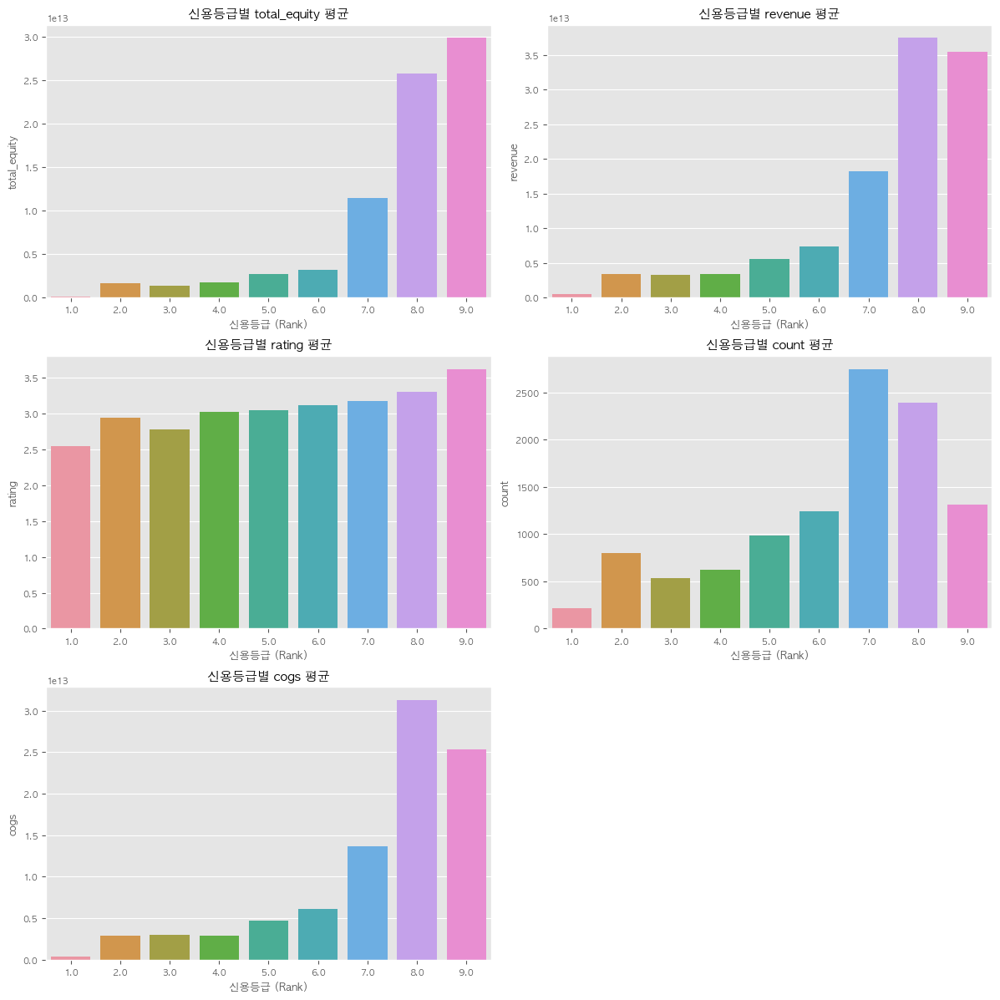

In [100]:
# 신용등급별 피쳐 값의 평균 계산
mean_features_by_rank = data_with_rank.groupby("rank")[top_5_columns.index].mean()

# 그래프 그리기
num_plots = len(top_5_columns)
num_rows = (num_plots // 2) + (num_plots % 2)

plt.figure(figsize=(12, 12))
for i, feature in enumerate(mean_features_by_rank.columns):
    plt.subplot(num_rows, 2, i+1)
    sns.barplot(x=mean_features_by_rank.index, y=mean_features_by_rank[feature])
    plt.xlabel("신용등급 (Rank)")
    plt.ylabel(feature)
    plt.title(f"신용등급별 {feature} 평균")
    plt.tight_layout()

plt.show()

### 신용등급별 음의 상관관계 지표 평균 비교

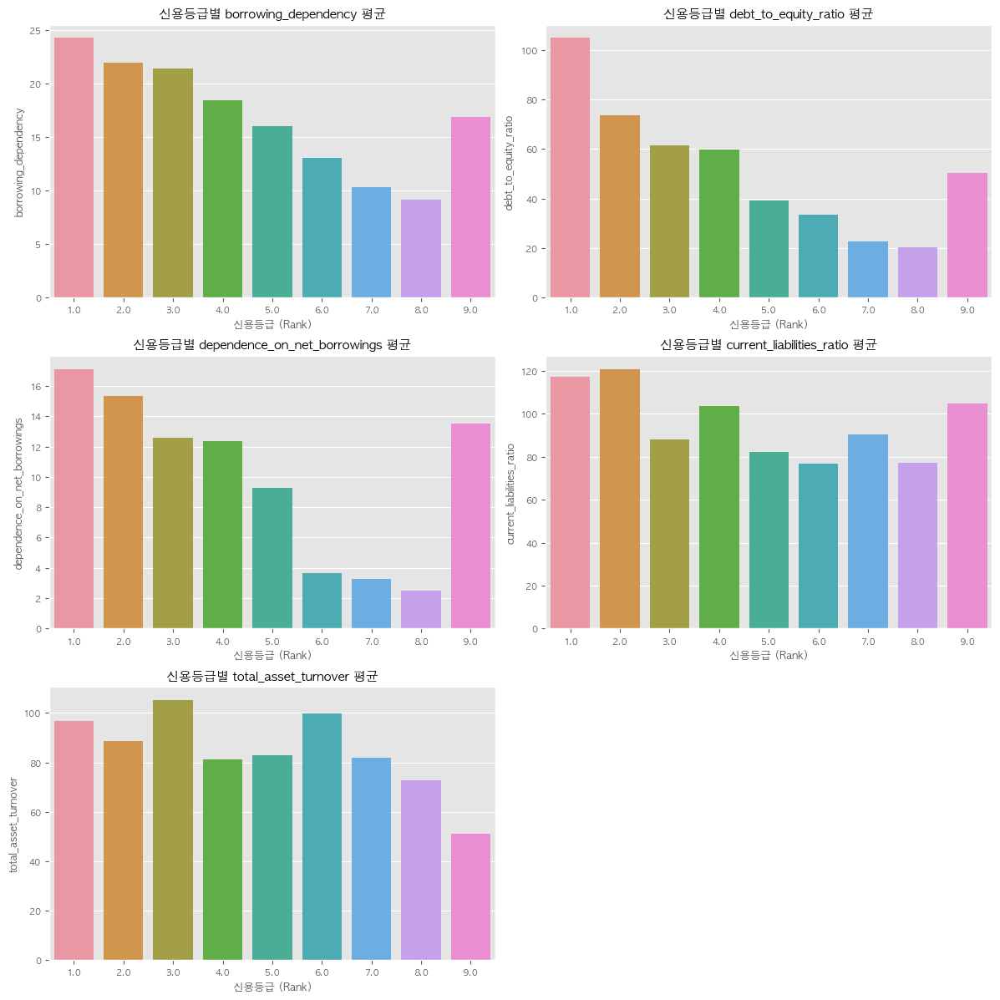

In [101]:
# 신용등급별 피쳐 값의 평균 계산
mean_features_by_rank = data_with_rank.groupby("rank")[bot_5_columns.index].mean()

# 그래프 그리기
num_plots = len(bot_5_columns)
num_rows = (num_plots // 2) + (num_plots % 2)

plt.figure(figsize=(12, 12))
for i, feature in enumerate(mean_features_by_rank.columns):
    plt.subplot(num_rows, 2, i+1)
    sns.barplot(x=mean_features_by_rank.index, y=mean_features_by_rank[feature])
    plt.xlabel("신용등급 (Rank)")
    plt.ylabel(feature)
    plt.title(f"신용등급별 {feature} 평균")
    plt.tight_layout()

plt.show()

## 매출액 클러스터별 신용등급과 각 컬럼간의 상관분석
<br>
기업이 속한 산업별로 매출액을 기준으로 그룹화 하되
<br>
매출액을 중심으로 군집화 하여 단순히 순서를 세워서 3등분 하기보다 우리나라 기업환경에서 유의미하게 나뉘는 구간으로 적용

In [102]:
from sklearn.cluster import KMeans
data_copy = data_with_rank.copy()

# 클러스터링
data_copy['rank'] = data_copy['rank'].astype(int)
cluster_data = data_copy[['revenue']]
kmeans = KMeans(n_clusters=3, random_state=0)
cluster_labels = kmeans.fit_predict(cluster_data)
data_copy['Cluster'] = cluster_labels

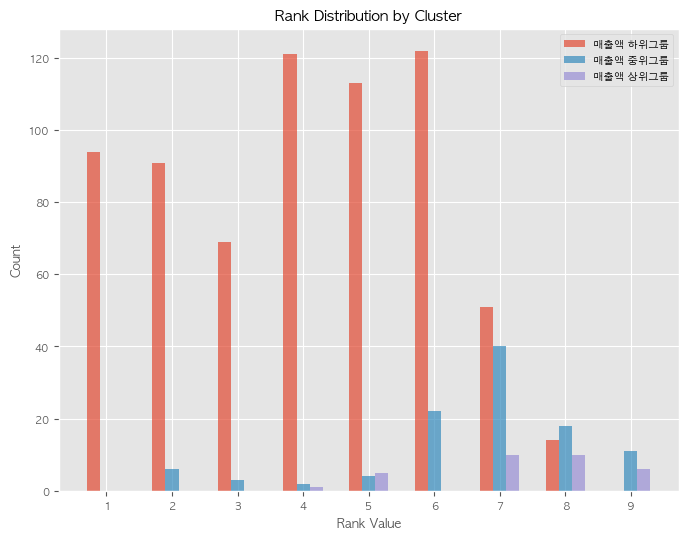

In [103]:
plt.figure(figsize=(8, 6))

# rank 값에 따라 그룹별로 옆으로 이동하여 바 그래프를 그리기 위한 변수 설정
bar_width = 0.2
offsets = [-bar_width, 0, bar_width]

# 그룹명 설정
group_names = ['매출액 하위그룹', '매출액 중위그룹', '매출액 상위그룹']

# 그룹별로 rank 값에 따른 바 그래프를 옆으로 이동하여 그리기
for idx, cluster_id in enumerate(data_copy['Cluster'].unique()):
    cluster_data = data_copy[data_copy['Cluster'] == cluster_id]
    cluster_rank = cluster_data['rank'].value_counts().sort_index()
    plt.bar(cluster_rank.index + offsets[idx], cluster_rank.values, alpha=0.7, width=bar_width, label=group_names[idx])

# 폰트 경로 설정
# font_path = 'C:\Windows\Fonts\malgun.ttf'
# font_name = font_manager.FontProperties(fname=font_path).get_name()
# rc('font', family=font_name)

plt.rcParams["font.family"] = 'AppleGothic'
plt.title('Rank Distribution by Cluster')
plt.xlabel('Rank Value')
plt.ylabel('Count')

plt.xticks(range(1, max(data_copy['rank']) + 1))
plt.legend()
plt.show()

매출액 하위그룹
Top 5 Correlations with '신용등급' in 매출액 하위그룹:
             Column  Correlation
0      total_equity     0.485001
1            rating     0.396052
2             count     0.390072
3  return_on_assets     0.381038
4               roa     0.381038



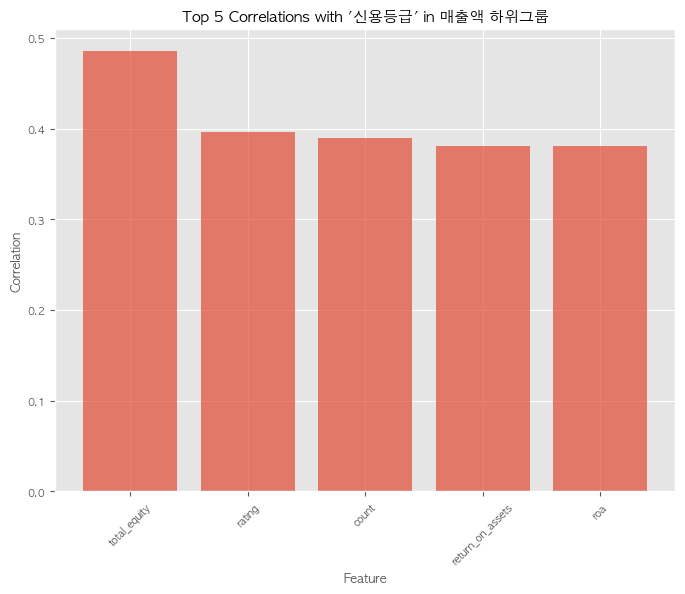

매출액 상위그룹
Top 5 Correlations with '신용등급' in 매출액 상위그룹:
                         Column  Correlation
0              total_borrowings     0.676358
1          borrowing_dependency     0.661206
2                net_borrowings     0.659822
3  dependence_on_net_borrowings     0.630765
4               tangible_assets     0.627175



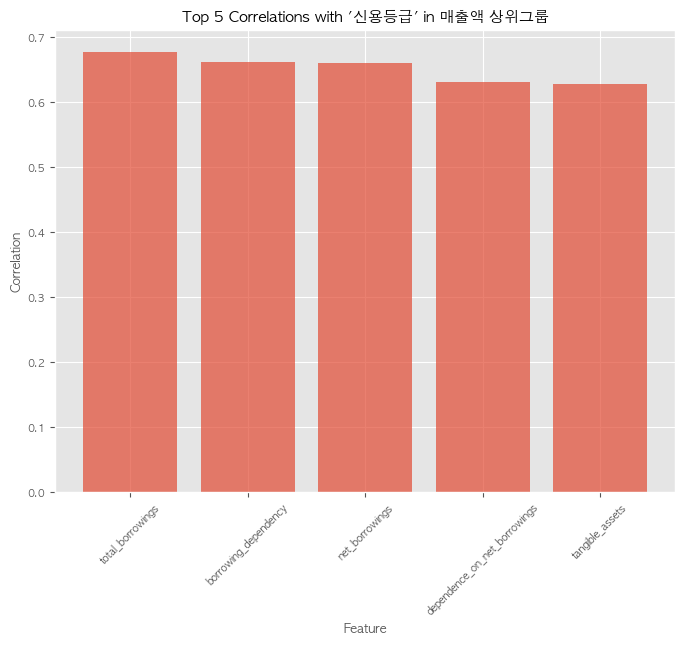

매출액 중위그룹
Top 5 Correlations with '신용등급' in 매출액 중위그룹:
                Column  Correlation
0                  ceo     0.454451
1     operating_income     0.431821
2            potential     0.427450
3            recommend     0.419646
4  gross_profit_margin     0.411987



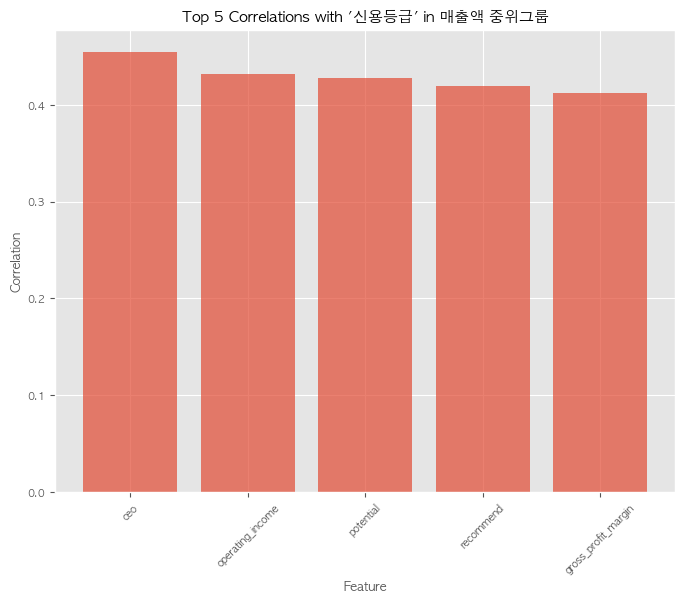

In [104]:
grouped_clusters = data_copy.groupby('Cluster')
group_names = ['매출액 하위그룹', '매출액 중위그룹', '매출액 상위그룹']

# 클러스터별 매출액 평균 계산
cluster_means = grouped_clusters['revenue'].mean()
sorted_cluster_means = cluster_means.sort_values()
group_names_mapping = {sorted_cluster_means.index[i]: group_names[i] for i in range(len(sorted_cluster_means))}

# 각 클러스터별로 상관관계가 높은 피쳐 상위 5개를 시각화
for cluster, df_cluster in grouped_clusters:
    df_cluster['Cluster'].unique()
    df_mean = df_cluster['revenue'].mean()
    df_cluster = df_cluster.drop(['sector', 'year', 'stock_code', 'corp', 'revenue', 'Cluster'], axis=1)
    correlation = df_cluster.corr().abs()
    selected_corr = correlation['rank'].drop('rank')
    top_5 = selected_corr.sort_values(ascending=False).head(5)
    result_df = pd.DataFrame({'Column': top_5.index, 'Correlation': top_5.values})
    result_df.reset_index(drop=True, inplace=True)
    cluster_label = group_names_mapping[cluster]
    print(cluster_label)
    print(f"Top 5 Correlations with '신용등급' in {cluster_label}:")
    print(result_df)
    print()

    # 상위 5개의 피쳐에 대한 바 그래프 시각화
    plt.figure(figsize=(8, 6))
    plt.bar(result_df['Column'], result_df['Correlation'], alpha=0.7)
    plt.title(f"Top 5 Correlations with '신용등급' in {cluster_label}")
    plt.xlabel('Feature')
    plt.ylabel('Correlation')
    plt.xticks(rotation=45)
    plt.show()


In [105]:
grouped_clusters = data_copy.groupby('Cluster')
group_names = ['매출액 하위그룹', '매출액 중위그룹', '매출액 상위그룹']

for cluster, df_group in grouped_clusters:
    # df_cluster = df_cluster.drop([ 'Cluster'], axis=1)
    correlation = df_group.corr().abs()
    selected_corr = correlation['rank']
    selected_corr.drop('rank', inplace=True)
    top_10 = selected_corr.sort_values(ascending=False).head(10)

    result_df = pd.DataFrame({'Column': top_10.index, 'Correlation': top_10.values})
    result_df.reset_index(drop=True, inplace=True)
    cluster_label = group_names_mapping[cluster]

    print(f"Top 10 Correlations with '신용등급' in {cluster_label} 매출액 클러스터:")
    print(result_df)
    print()


Top 10 Correlations with '신용등급' in 매출액 하위그룹 매출액 클러스터:
             Column  Correlation
0      total_equity     0.485001
1           revenue     0.421850
2            rating     0.396052
3             count     0.390072
4  return_on_assets     0.381038
5               roa     0.381038
6         potential     0.373906
7         recommend     0.368618
8               ceo     0.365736
9      equity_ratio     0.364244

Top 10 Correlations with '신용등급' in 매출액 상위그룹 매출액 클러스터:
                         Column  Correlation
0              total_borrowings     0.676358
1          borrowing_dependency     0.661206
2                net_borrowings     0.659822
3  dependence_on_net_borrowings     0.630765
4               tangible_assets     0.627175
5                  total_equity     0.626034
6       tangible_asset_turnover     0.620861
7            inventory_turnover     0.613491
8                           ceo     0.600737
9                    debt_ratio     0.592575

Top 10 Correlations with '신용등급' 

In [106]:
profitability = ['gross_profit_margin', 'operating_profit_margin', 'net_profit_margin',
                 'ebitda_margin', 'return_on_equity', 'return_on_assets', 'return_on_invested_capital']
growth = ['revenue_growth_rate','operating_income_growth_rate','net_income_growth_rate','total_asset_growth_rate','tangible_asset_growth_rate',
          'total_liabilities_growth_rate','total_equity_growth_rate']
stability = ['debt_ratio', 'current_ratio', 'quick_ratio', 'non_current_debt_ratio', 'equity_ratio', 'interest_coverage_ratio',
             'debt_to_equity_ratio', 'net_debt_ratio', 'retention_ratio']
activity = ['total_asset_turnover', 'return_on_equity', 'net_working_capital_turnover',
            'tangible_asset_turnover', 'accounts_receivable_turnover', 'inventory_turnover',
            'accounts_payable_turnover']
valuation = ['earnings_per_share', 'book_value_per_share', 'price_earnings_ratio',
             'price_to_book_ratio', 'price_cash_flow_ratio', 'enterprise_value_to_ebitda']
rating = ['rating', 'count', 'paywellfare', 'worklifebal', 'culture', 'opportunity', 'manager',
       'recommend', 'ceo', 'potential']
summary = ['ebitda_margin','ebitda_to_interest_expense', 'debt_ratio',
       'dependence_on_net_borrowings', 'net_borrowings_to_ebitda']
operating_profitability = ['revenue', 'cogs', 'selling_general_administrative_expenses', 'ebit',
       'ebit_margin', 'ebitda_to_sales_revenue','total_assets','return_on_assets']
cash_flow_trends = ['ebitda', 'financial_expenses', 'corporate_tax',
       'operating_cash_flow', 'free_cash_flow']
financial_stability = ['total_liabilities',
       'total_equity', 'total_borrowings', 'net_borrowings',
       'borrowing_dependency', 'total_borrowings_to_ebitda',
       'debt_to_net_income_ratio', 'total_assets_leverage',
       'current_liabilities', 'working_capital', 'current_liabilities_ratio',
       'quick_assets', 'quick_ratio']
liquidity = ['cash_and_cash_equivalents',
       'short_term_borrowings', 'days_sales_outstanding']

# Calculate average correlations for the given variables
variables = {
    'profitability': profitability,
    'stability': stability,
    'activity': activity,
    'valuation': valuation,
    'rating': rating,
    'summary': summary,
    'operating_profitability': operating_profitability,
    'cash_flow_trends': cash_flow_trends,
    'financial_stability': financial_stability,
    'liquidity': liquidity
}

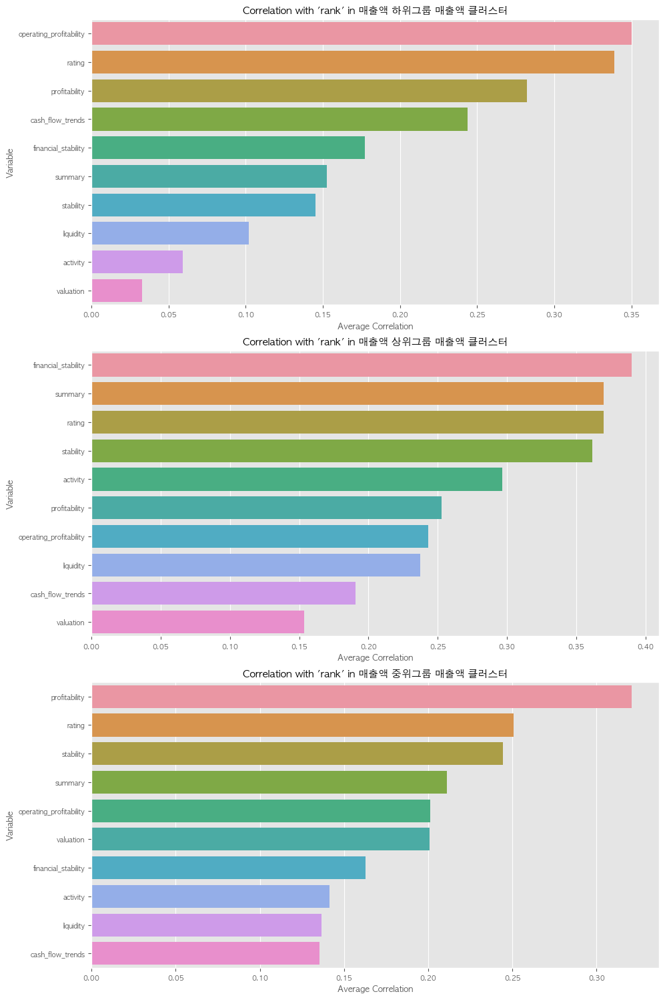

In [107]:
# 각 클러스터별로 데이터프레임 분할
grouped_clusters = data_copy.groupby('Cluster')

# DataFrame을 저장하고 시각화
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for idx, (cluster, df_cluster) in enumerate(grouped_clusters):
    df_cluster = df_cluster.drop(['corp', 'sector', 'year', 'stock_code', 'Cluster'], axis=1)
    correlation = df_cluster.corr().abs()
    selected_corr = correlation['rank']
    selected_corr.drop('rank', inplace=True)
    corr_results = []
    
    for var_name, var_list in variables.items():
        var_corr = selected_corr.loc[var_list]
        avg_corr = var_corr.mean()
        corr_results.append((var_name, avg_corr))
    
    df_results = pd.DataFrame(corr_results, columns=['Variable', 'Avg Correlation'])
    df_results.sort_values('Avg Correlation', ascending=False, inplace=True)
    
    cluster_label = group_names_mapping[cluster]
    ax = axes[idx]
    sns.barplot(x='Avg Correlation', y='Variable', data=df_results, ax=ax)
    ax.set_xlabel('Average Correlation')
    ax.set_ylabel('Variable')
    ax.set_title(f"Correlation with 'rank' in {cluster_label} 매출액 클러스터")

plt.tight_layout()
plt.show()


## 기업별 평균 지표

In [108]:
comapny_average = data_without_rank.drop(['stock_code', 'sector', 'year'], axis=1).groupby('corp').mean()
comapny_average.reset_index(inplace=True)
comapny_average

,corp,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,...,enterprise_value_to_ebitda,operating_income,net_income,tangible_assets,total_asset_turnover,net_working_capital_turnover,tangible_asset_turnover,accounts_receivable_turnover,inventory_turnover,accounts_payable_turnover
0,AJ네트웍스,1.682361,29.750580,375.472513,21.565957,-114.203844,1.021611e+12,9.938071e+11,9.938080e+08,1.781369e+10,...,0.313937,1.021611e+12,3.231746e+10,2.184204e+11,61.001296,-282.143782,489.880007,1119.558857,3107.816169,2426.839634
1,AK홀딩스,-2.932864,-0.627784,225.382378,18.133541,96.111622,3.409272e+12,2.678728e+12,7.321522e+11,-7.196199e+10,...,1.826289,-1.607489e+09,-6.346371e+10,1.551229e+12,80.903609,-3707.621982,221.643343,1209.225283,953.987965,836.070596
2,BGF,18.101022,1051.475008,9.898622,-3.168314,-148.481771,2.187096e+11,1.249642e+11,5.980865e+10,3.508276e+10,...,16.071684,3.391622e+10,2.895100e+10,1.393122e+11,12.191773,68.634723,184.087371,1008.859553,1889.228863,1579.509540
3,BGF리테일,3.140423,1188.954621,220.056173,-2.676060,-29.897372,6.460026e+12,5.321786e+12,9.370411e+11,2.026614e+11,...,14.444960,2.000387e+11,1.538913e+11,5.863871e+11,288.729347,-4362.166664,1104.396903,9574.550200,4871.603197,1003.225872
4,BYC,20.882925,773.388383,52.557860,6.263936,197.176465,1.728885e+11,1.021634e+11,3.760251e+10,3.549664e+10,...,7.899586,2.394383e+10,2.406170e+10,6.876568e+10,24.921664,1543.507139,252.828386,3340.526780,255.460608,707.030807
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
630,후성,9.688294,675.234018,112.022290,19.803342,1556.053539,3.554597e+11,2.683789e+11,4.321209e+10,4.335977e+10,...,120.068047,4.386870e+10,3.492491e+10,3.781868e+11,57.004862,-125.747480,92.240483,796.247475,519.285920,585.781346
631,휠라홀딩스,12.036307,596.889015,100.855860,13.459408,130.563497,3.509916e+12,1.779628e+12,1.310932e+12,4.228461e+11,...,7.923122,4.193560e+11,3.102571e+11,4.146082e+11,88.039567,422.305302,852.143346,714.440405,229.790503,388.400821
632,휴비스,4.798675,349.708598,105.621868,-5.918987,-42.133149,1.063292e+12,9.741262e+11,8.865085e+10,5.753754e+09,...,2.428225,5.153791e+08,4.670312e+09,4.374393e+11,122.326854,-804.694361,243.603868,824.737186,674.426566,480.719475
633,휴스틸,10.128320,525.005750,45.015491,4.818153,-354.875075,6.277599e+11,5.233603e+11,2.937519e+10,7.100714e+10,...,-4.182711,7.502437e+10,5.568479e+10,3.403384e+11,80.206929,338.770370,188.788357,754.688202,313.044408,1347.992082


## 산업별 평균 지표

In [109]:
# 산업별 테이블 생성
industry_average = model_b_processed.drop(['corp','stock_code','rank'], axis = 1).groupby(['sector', 'year']).mean()

# 산업별 연도 전부 평균
industry_average = industry_average.reset_index().drop(['year'],axis=1).groupby(['sector']).mean()
industry_average.reset_index(inplace = True)

industry_average.head()

,sector,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,...,enterprise_value_to_ebitda,operating_income,net_income,tangible_assets,total_asset_turnover,net_working_capital_turnover,tangible_asset_turnover,accounts_receivable_turnover,inventory_turnover,accounts_payable_turnover
0,건설업,4.824406,7036.560063,187.921750,-1.597485,83.990197,2.823508e+12,2.498725e+12,1.450725e+11,1.507408e+11,...,55.610890,1.860727e+11,1.132295e+11,2.729056e+11,95.095555,597.692782,2311.782439,1033.538973,10185.131774,920.409837
1,광업,-45.746567,-178.375569,75.947365,-11.514889,148.323892,3.365605e+10,2.503869e+10,1.673835e+10,-1.677076e+10,...,-37.070443,-8.120985e+09,-1.853521e+10,1.398637e+10,24.621067,-584.138574,267.504943,434.963087,367.427364,662.314706
2,기계,-5.420114,580.560840,182.035423,7.613076,107.825995,1.181312e+12,9.912040e+11,1.257499e+11,2.488481e+10,...,15.989037,6.308501e+10,1.761420e+10,4.728099e+11,73.359180,666.065756,343.858304,610.184187,698.163850,821.928904
3,기타금융,8.271489,2329.111493,106.357378,4.134738,246.520993,6.097848e+12,5.090337e+12,6.206842e+11,2.831707e+11,...,2.543453,3.917693e+11,2.352824e+11,2.538228e+12,71.981627,817.225894,447.973563,880.537613,2176.167424,1553.949515
4,기타제조업,7.253613,1477.699463,105.658043,9.223554,572.227488,8.829107e+11,5.521635e+11,1.936285e+11,1.437893e+11,...,21.658786,1.371186e+11,1.018178e+11,2.911067e+11,106.363471,1044.561929,453.268610,732.934373,485.947753,787.657421


### 성장성 지표 따로 추출
- 재무제표 5개년 사용시, 성장성 지표는 4개년치 사용 가능하므로 따로 데이터프레임으로 생성

In [110]:
# growth_data 테이블에서 성장성 지표만 추출하기

growth_data['average'] = growth_data[['2019', '2020', '2021', '2022']].mean(axis=1)
growth_industry = growth_data.drop(['corp','stock_code','label_ko','2018','YoY','2019', '2020', '2021', '2022'], axis = 1)
growth_industry = pd.pivot_table(growth_data, values='average', index='sector', columns='label_en').reset_index()

growth_company = growth_data.drop(['stock_code','sector','label_ko','2018','YoY','2019', '2020', '2021', '2022'], axis = 1)
growth_company = pd.pivot_table(growth_data, values='average', index='corp', columns='label_en').reset_index()
growth_company = growth_company.merge(growth_data[['corp', 'sector']], on='corp', how='left')
growth_company = growth_company.drop_duplicates(subset=['corp'])
growth_company = growth_company.reset_index(drop=True)
growth_company = growth_company[['corp'] + list(growth_company.columns[2:-1]) + [growth_company.columns[-1]]]

In [111]:
# 산업별 성장성 지표

growth_columns = ['sector', 'revenue_growth_rate', 'operating_income_growth_rate', 'net_income_growth_rate',
                    'total_asset_growth_rate', 'tangible_asset_growth_rate', 'total_liabilities_growth_rate',
                    'total_equity_growth_rate']

growth_industry = growth_industry[growth_columns]
growth_industry.head()

label_en,sector,revenue_growth_rate,operating_income_growth_rate,net_income_growth_rate,total_asset_growth_rate,tangible_asset_growth_rate,total_liabilities_growth_rate,total_equity_growth_rate
0,건설업,7.309072,-19.854509,36.317525,8.200965,372.595254,8.577381,8.729716
1,광업,42.743204,-146.317172,20.496085,-4.843506,51.058278,-8.701846,4.206552
2,기계,9.314800,-45.469973,-253.084554,5.538847,8.049392,9.417315,-411.618859
3,기타금융,32.603851,-145.822431,198.917180,12.073753,10.681150,10.417565,18.307405
4,기타제조업,10.006251,11.937759,-30.528637,11.662987,21.608847,26.716008,9.687394


In [112]:
# 기업별 성장성지표

growth_columns = ['corp', 'sector', 'revenue_growth_rate', 'operating_income_growth_rate', 'net_income_growth_rate',
                    'total_asset_growth_rate', 'tangible_asset_growth_rate', 'total_liabilities_growth_rate',
                    'total_equity_growth_rate']

growth_company = growth_company[growth_columns]
growth_company.head()

,corp,sector,revenue_growth_rate,operating_income_growth_rate,net_income_growth_rate,total_asset_growth_rate,tangible_asset_growth_rate,total_liabilities_growth_rate,total_equity_growth_rate
0,AJ네트웍스,서비스업,4.629007,4.629007,-649.246567,-11.813194,-8.286568,-12.919150,-5.190212
1,AK홀딩스,기타금융,2.869547,-108.008194,-171.586848,10.718940,6.921552,19.264404,-3.170853
2,BGF,기타금융,40.781425,41.335601,3.288904,4.838421,13.500088,24.641060,3.587671
3,BGF리테일,유통업,7.228791,8.939749,7.661051,19.663009,9.234722,21.763088,16.589375
4,BYC,섬유의복,-3.530296,4.725882,63.223812,-2.412924,4.376112,-17.322929,6.077723


In [113]:
# industry_average 테이블에 조인
industry_average = growth_industry.merge(industry_average, on='sector')

# comapny_average 테이블에 조인
comapny_average = growth_company.merge(comapny_average, on='corp')

## [투자지표] 산업별로 확인해보기
---

|수익성 (Profitability)|성장성 (Growth)|안정성 (Stability)|활동성 (Activity)|가치지표 (Valuation)|
|---|---|---|---|---|
|매출총이익률 (Gross Profit Margin)|매출액증가율 (Revenue Growth Rate)|부채비율 (Debt Ratio)|총자산회전율 (Total Asset Turnover Ratio)|EPS (Earnings Per Share)|
|영업이익률 (Operating Profit Margin)|영업이익증가율 (Operating Income Growth Rate)|유동비율 (Current Ratio)|자기자본회전율 (Return on Equity)|BPS (Book Value Per Share)|
|순이익률 (Net Profit Margin)|순이익증가율 (Net Income Growth Rate)|당좌비율 (Quick Ratio)|순운전자본회전율 (Net Working Capital Turnover Ratio)|PER (Price-Earnings Ratio)|
|EBITDA마진율 (EBITDA Margin)|총자산증가율 (Total Asset Growth Rate)|비유동부채비율 (Non-Current Debt Ratio)|유형자산회전율 (Tangible Asset Turnover Ratio)|PBR (Price-to-Book Ratio)|
|ROE (Return on Equity)|유형자산증가율 (Tangible Asset Growth Rate)|자기자본비율 (Equity Ratio)|매출채권회전율 (Accounts Receivable Turnover Ratio)|PCR (Price-Cash Flow Ratio)|
|ROA (Return on Assets)|부채총계증가율 (Total Debt Growth Rate)|이자보상배율 (Interest Coverage Ratio)|재고자산회전율 (Inventory Turnover Ratio)|EV/EBITDA (Enterprise Value to EBITDA)|
|ROIC (Return on Invested Capital)|자기자본증가율 (Equity Growth Rate)|차입금비율 (Debt-to-Equity Ratio)|매입채무회전율 (Accounts Payable Turnover Ratio)||
|||순부채비율 (Net Debt Ratio)|||
|||자본유보율 (Retention Ratio)|||


---
> 종합적으로,
> - `수익성지표`에서는 통신업, 서비스업, 의료정밀 산업이 높은 평가를 받고 있다. 광업은 전반적인 수익성 지표에서 현저히 낮은 평가를 나타냄을 확인 할 수 있다.
> - `성장성지표`에서는 주요지표인 매출액 증가율에서는 전기가스업 1등, 서비스업 2등을 위치하고 있으며 각 산업군에 특징에 따라 지표별로 다양하게 순위가 분포되어 있다.
> - `안정성지표`에서는 대체적으로 평이하나 주요지표에서 운수창고업, 전기가스업 1,2등을 위치하고 있다.
> - `활동성지표`에서는 산업군의 특징에 따라 지표별로 고르게 분포하고 있다.
> - `가치지표`에서는 EPS같은 지표에서는 건설업, 철강금속 압도적이며, 의료정밀 같은 경우 PBR 에서 압도적이지만 다른 가치지표에서 최하위에 위치하고 있다.

In [114]:
def plot_indicators(data, indicator_name, colors):
    plt.figure(figsize=(15, 6 * len(data)))
    
    for i, column in enumerate(data):
        ax = plt.subplot(len(data), 1, i+1)
        column_values = industry_average[column]
    
        color = random.choice(colors)
        
        ax.bar(industry_average['sector'], column_values, color=color)
        ax.set_title(column, fontsize=20)
        ax.set_xlabel('Sector')
        ax.set_ylabel(column)
        ax.tick_params(axis='x', labelrotation=45, labelsize=16)
    
    plt.suptitle(f'{indicator_name} Indicators', fontsize=30, y=1.001)
    plt.tight_layout()
    plt.show()

colors = ['#FF6F61', '#6B5B95', '#88B04B', '#955251', '#B565A7', '#009B77', '#F6A600']

## 수익성 지표
---
- `매출총이익률`: 통신업이 압도적 1등
- `영업이익률`: 통신업과 서비스업이 압도적 1,2등
- `순이익률`: 기타금용, 의료정밀 1,2등
- `EBITDA마진율`: 의료정밀 1등
- `ROE`: 건설업 1등
- `ROA`: 의료정밀 1등
- `ROIC`: 건설업과 의료정밀 1,2등

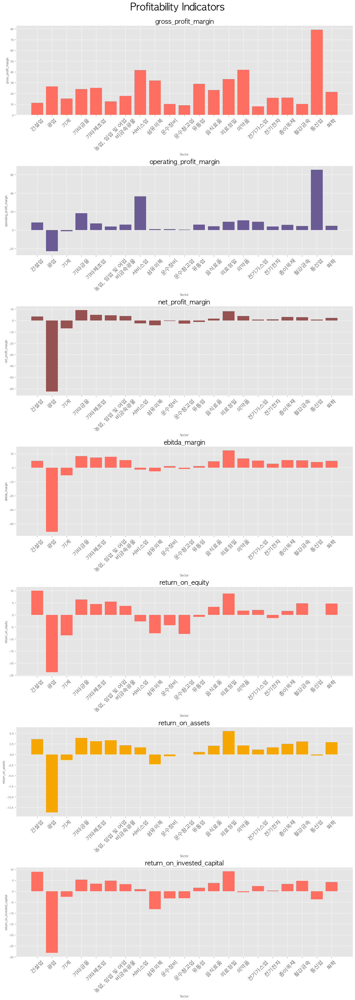

In [115]:
plot_indicators(profitability, 'Profitability', colors)

## 성장성 지표
---
- `매출액증가율` : 전기가스업 1등, 서비스업 2등
- `영업이익증가율` : 섬유의복 1등, 철강금속 2등, 음식료품 꼴등
- `순이익증가율` : 종이목재 1등, 전기가스업 꼴등
- `총자산증가율` : 서비스업 1등
- `유형자산증가율` : 건설업 1등
- `부채총계증가율` : 서비스업 1등 광업 꼴등
- `자기자본증가율` : 기계 압도적 꼴등

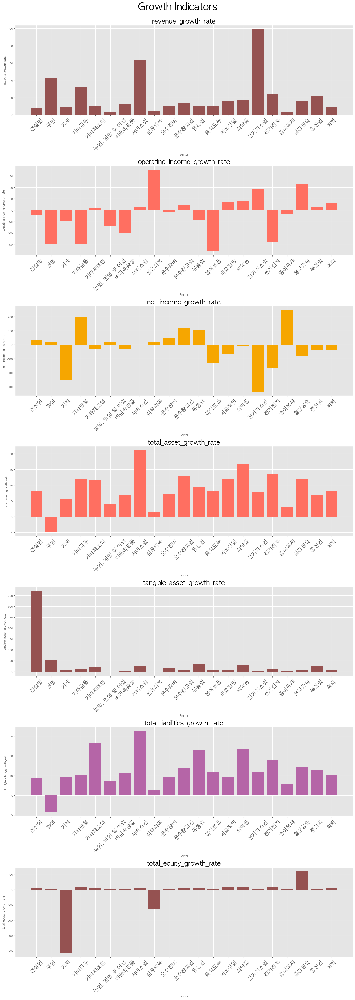

In [116]:
plot_indicators(growth, 'Growth', colors)

## 안정성 지표
---
- `부채비율` : 대체적으로 평이함, 운수창고업 1등
- `유동비율` : 의료정밀, 의약품, 전기전자 1등
- `당좌비율` : 대체적으로 평이함
- `비유동부채비율` : 운수창고업, 전기가스업 1,2등
- `자기자본비율` : 의료정밀 1등
- `이자보상배율` : 서비스업, 건설업 1,2등
- `차입금비율` : 종이목재 압도적 1등
- `순부채비율` : 운수창고업 1등
- `자본유보율` : 철강금속 1등


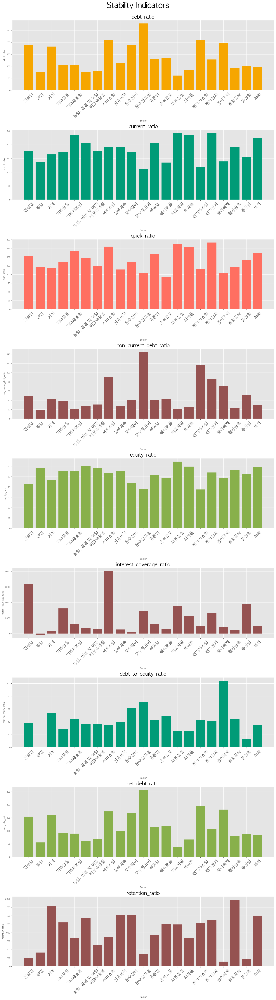

In [117]:
plot_indicators(stability, 'Stability', colors)

## 활동성 지표
---

- `총자산회전율` : 대체적으로 평이. 광업 꼴등
- `자기자본회전율` : 광업 꼴등
- `순운전자본회전율` : 통신업, 전기전자 1,2등
- `유형자산회전율` : 건설업, 서비스업, 유통업 우세
- `매출채권회전율` : 종이목재 1등
- `재고자산회전율` : 운수창고업 1등, 서비스업, 전기가스업 상대적으로 높음
- `매입채무회전율` : 유통업 압도적 1등

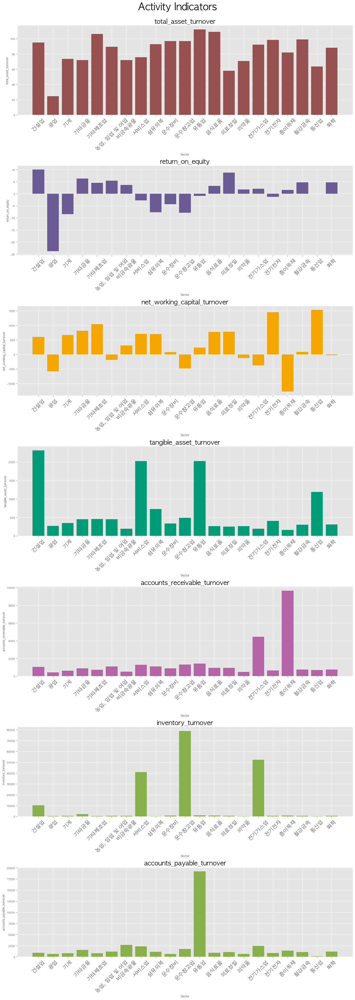

In [118]:
plot_indicators(activity, 'Activity', colors)

## 가치 지표
---
- 'EPS' : 건설업, 철강금속 압도적 1등
- 'BPS' : 철강금속 압도적 1등
- 'PER' : 전기전자 1등, 의료정밀 꼴등
- 'PBR' : 의료정밀, 전기전자 1등
- 'PCR' : 의약품 1등. 의료정밀 압도적 꼴등
- 'EV/EBITDA' : 의료정밀 꼴등

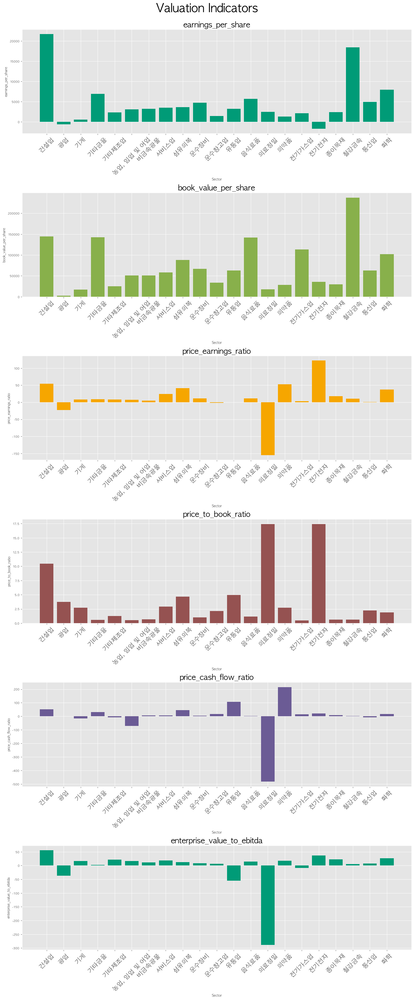

In [119]:
plot_indicators(valuation, 'Valuation', colors)

## 산업별로 평점(별점) 어떻게 차이가 날까?
---
| 별점 (rating)             |
|----------------------------------|
| 총 별점 (rating) |
| 별점 총 수 (count)  |
| 임금 및 복지 (paywellfare)       |
| 업무와 삶의 균형 (worklifebal)      |
| 사내 문화 (culture)            |
| 승진 가능성 및 기회 (opportunity)          |
| 경연진 평 (manager) |
| 기업 추천도 (recommend) |
| CED 지지율 (ceo) |
| 성장 잠재성 (potential) |       

---
> 큰 차이는 확인 할 수 없으나. 기타제조업, 농업,임업 및 어업 두 산업이 대체적으로 낮은 평가를 받고 있는 것을 확인 할 수 있다.


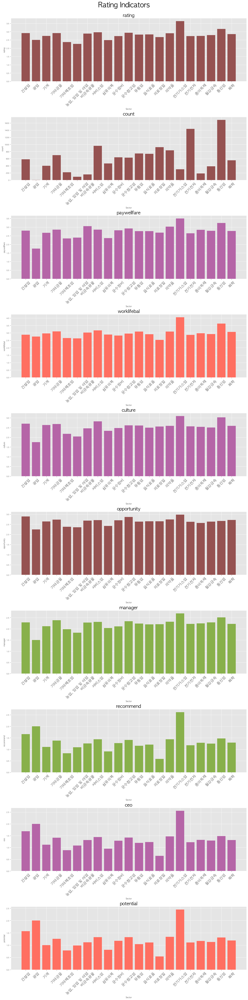

In [120]:
plot_indicators(rating, 'Rating', colors)

## [신용지표] 산업별로 확인해보기
---
| 요약 (Summary) | 영업성과 (Operating Profitability) | 현금흐름 동향 (Cash Flow Trends) | 재무 안정성 (Financial Stability) | 유동성 (Liquidity) |
| ------------------------ | ------------------------------ | -------------------------- | ----------------------------- | ---------------- |
| EBITDA 마진율 (ebitda_margin) | 매출액 (revenue) | EBITDA (ebitda) | 총부채 (total_liabilities) | 현금 및 현금성 자산 (cash_and_cash_equivalents) |
| EBITDA 대 이자비용 (ebitda_to_interest_expense) | 상품 판매 비용 (cogs) | 재무 비용 (financial_expenses) | 총자본 (total_equity) | 단기차입금 (short_term_borrowings) |
| 부채비율 (debt_ratio) | 판매 및 경영 비용 (selling_general_administrative_expenses) | 법인세 (corporate_tax) | 총차입금 (total_borrowings) | 매출채권 회전일수 (days_sales_outstanding) |
| 순차입금 의존도 (dependence_on_net_borrowings) | 영업이익 (ebit) | 영업활동으로 인한 현금흐름 (operating_cash_flow) | 순차입금 (net_borrowings) | |
| 순차입금 대 EBITDA (net_borrowings_to_ebitda) | 영업이익률 (ebit_margin) | 잉여현금흐름 (free_cash_flow) | 차입금 의존도 (borrowing_dependency) | |
| | EBITDA 대 매출액 (ebitda_to_sales_revenue) | | 총차입금 대 EBITDA (total_borrowings_to_ebitda) | |
| | 총자산 (total_assets) | | 순이익 대 부채 비율 (debt_to_net_income_ratio) | |
| | 자산수익률 (return_on_assets) | | 총자산 레버리지 (total_assets_leverage) | |
| | | | 유동부채 (current_liabilities) | |
| | | | 운전자본 (working_capital) | |
| | | | 유동부채비율 (current_liabilities_ratio) | |
| | | | 당좌자산 (quick_assets) | |
| | | | 당좌비율 (quick_ratio) | |

---
> 종합적으로 신용등급을 평가하는데 활용하는 주요지표 중
> - `ebitda마진`의 경우 광업이 다른 산업에 비해 월등히 낮음, 의료정밀 산업의 경우 다른 산업에 비해 상대적으로 ebitda마진율이 높은 것으로 나타남.
> - `ebitda/이자비용`의 경우 건설, 의료정밀에서 상대적으로 높음.
> - `부채비율`는 운수창고업에서 가장 높음.
> - `순차입금/ebitda` 전기가스업에서 압도적으로 높게 나와 순차입금이 많고 그에 반해 순수한 영업이익(ebidtda)은 것으로 파악됨.

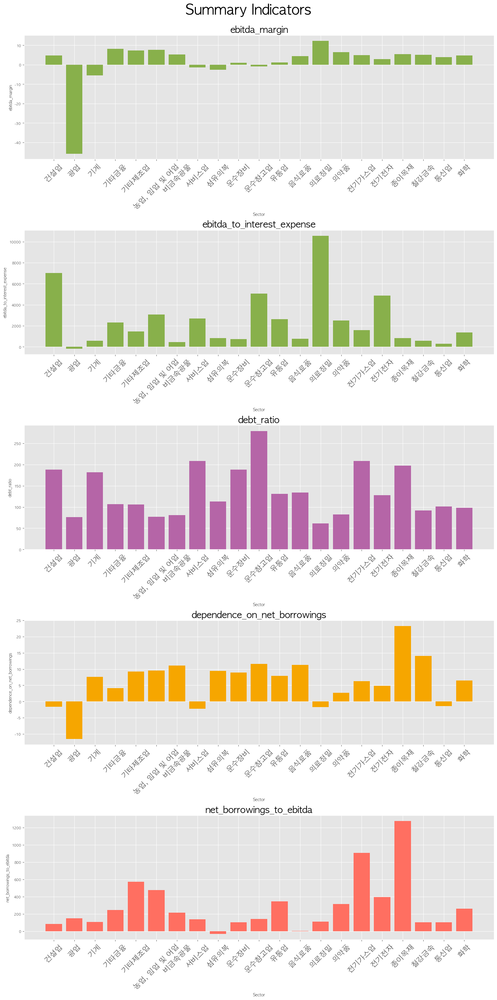

In [121]:
plot_indicators(summary, 'Summary', colors)

### 영업수익성 지표
> 업종별로 영업수익성을 나타내는 지표들을 확인한 결과 매출의 규모로 봤을 때 통신업과 전기가스업, 전기전자 업종이 우세한 것으로 드러남. 
> <br> 전기가스업의 경우 매출액은 높으나 매출원가가 높아서 ebit에서 유일하게 마이너스 값을 기록.
> <br>총 자산의 경우 전기가스업과 통신업, 전기전자업종들이 업종 특성상 설비투자의 규모가 커서 가장 높게 나옴. 
> <br>ROA의 경우 의료정밀 업이 가장 높게 나왔고, 광업의 경우 타 산업과 비교도 되지 않을 정도로 마이너스값이 높게 나옴 


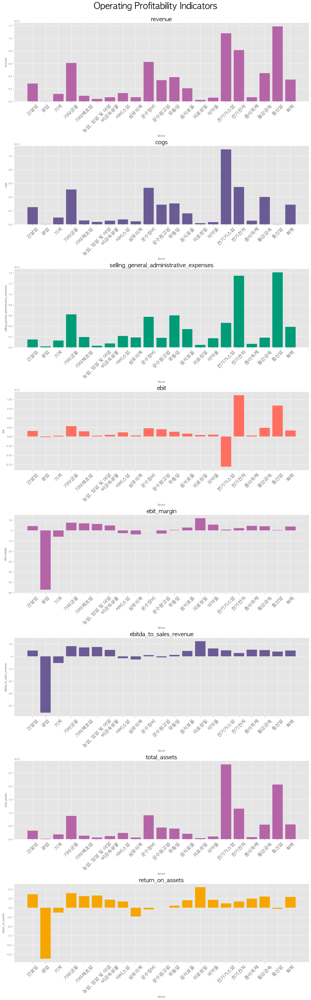

In [122]:
plot_indicators(operating_profitability, 'Operating Profitability', colors)

### 현금흐름지표

> 법인세와 이자비용, 감가상각을 제외한 순수이익을 나타내는 ebitda의 경우 국내에서 큰 산업에 속하는 통신업과 전기가스업이 가장 높게 나옴.
> <br> 운영현금, 자유현금흐름에서도 통신업과 전기전자업에서 가용가능한 현금흐름이 큰 것으로 드러남.
> <br> 금융비용의 경우 전기가스업, 전기전자, 금융업에서 높았음.

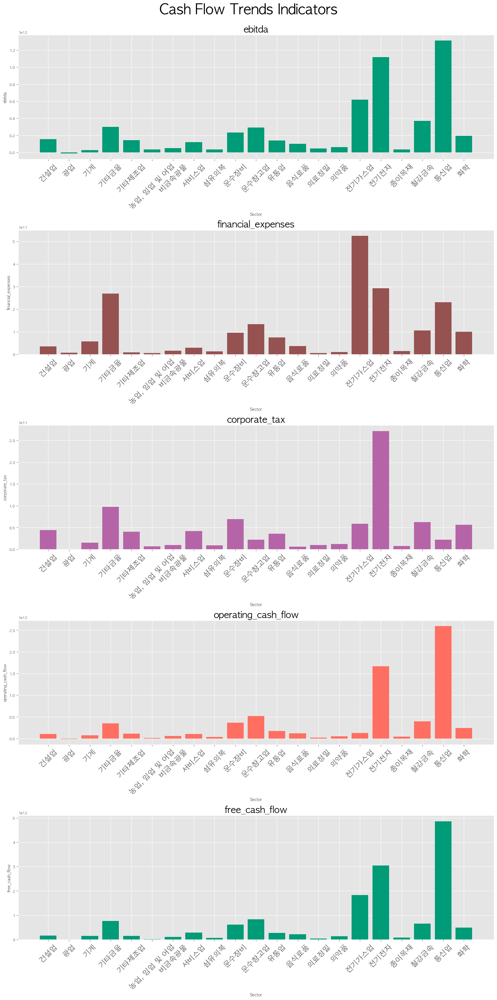

In [123]:
plot_indicators(cash_flow_trends, 'Cash Flow Trends', colors)

### 재무 안전성

> 재무 안정성 지표들을 확인한 결과
<br> 대체적으로 돈을 많이 버는 통신업, 전기전자업의 경우 총 자본, 차입금, 운영자본 등이 매출과 비례하여 높았고,
<br> 특이한 사항으로 전기가스업이 부채, 총차입금, 순차입금의 경우 전기가스업이 가장 높은 경향을 보임. 
<br> 총차입금/ebitda 비율은 종이목재업이 가장 높아 수익성이 좋지 않은 것으로 판단되거, 차입금의 경우 업의 본질이 대출을 기반으로한 금융업이 높게 나옴

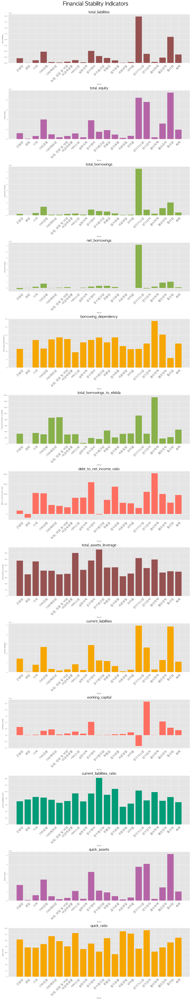

In [124]:
plot_indicators(financial_stability, 'Financial Stability', colors)

### 유동성지표

현금성 자산 역시 수익을 많이 발생시키는 전기전자, 통신업이 많은 것으로 파악
<br> 단기차입금 철강금속이 가장 많음
<br> 광업의 경우 매출채권회수일수가 가장 높게 나왔고 나머지 업계는 비슷


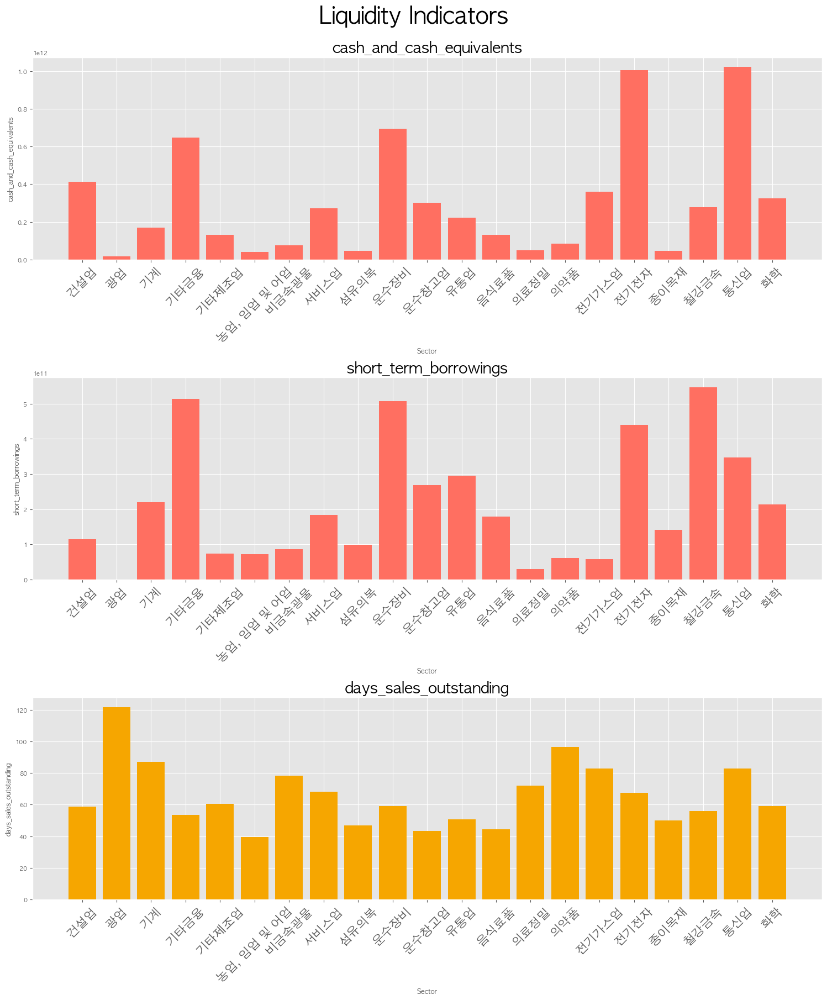

In [65]:
plot_indicators(liquidity, 'Liquidity', colors)

### 경제지표 (최저임금, 환율, 기준금리)과 투자지표간의 상관분석
- 경제지표 : 최저임금, 환율, 생산자물가지수, 한미금리차이, 한국기준금리, CRB지수
- 투자지표 : 매출액 / ROE / 잉여현금흐름 / 매출총이익률 / ROA
- 산업에 미치는 영향을 연도별로 보기 (긍정적인 영향 / 부정적인 영향)
  - 광업(5) 농업 / 임업 및 어업(15) / 통신업(25) / 의료정밀(29) <30 : 표본크기 작은 점 고려   
- 영향을 미치는 요소들만 확인 (p-value < 0.05)

In [125]:
model_b['sector'].value_counts()

화학             420
서비스업           342
전기전자           288
유통업            262
기타금융           249
운수장비           240
의약품            175
기계             168
철강금속           157
음식료품           142
건설업            118
운수창고업          110
섬유의복            93
비금속광물           87
종이목재            65
기타제조업           60
전기가스업           47
의료정밀            29
통신업             25
농업, 임업 및 어업     15
광업               5
Name: sector, dtype: int64

임금, 지수 등 스케일이 다른 지표간의 비교를 위해 스케일링을 진행

In [126]:
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler

sectors = model_b['sector'].unique()

X_vars = ['minimum_wage', 'us_kor_exchange_avg', 'ppi_year',
          'kor_usa_ir_diff', 'kr_standard_yield', 'crb_index_avg']

scaler = StandardScaler()

for sector in sectors[:3]:
    print(f"Sector: {sector}")
    data_subset = model_b[model_b['sector'] == sector]
    y = data_subset['market_capitalization']
    X = data_subset[X_vars]
    X = sm.add_constant(X)
    
    X.iloc[:, 1:] = scaler.fit_transform(X.iloc[:, 1:])

    model = sm.OLS(y, X)
    results = model.fit()

    result_df = pd.DataFrame({
        'coef': results.params,
        'p-value': results.pvalues,
    })
    
    result_df['p-value'] = result_df['p-value'].map('{:.5f}'.format)
    print(result_df, end="\n\n")

Sector: 서비스업
                             coef  p-value
const                2.305329e+12  0.00000
minimum_wage         4.461668e+11  0.46997
us_kor_exchange_avg -6.749225e+11  0.33743
ppi_year             2.803214e+11  0.34689
kor_usa_ir_diff      2.078701e+11  0.71260
kr_standard_yield   -4.618797e+11  0.30032
crb_index_avg        3.338058e+11  0.46981

Sector: 기타금융
                             coef  p-value
const                1.612282e+12  0.00000
minimum_wage         1.160536e+11  0.76714
us_kor_exchange_avg -3.197921e+11  0.47924
ppi_year             1.276920e+11  0.50951
kor_usa_ir_diff      1.489400e+10  0.96725
kr_standard_yield   -1.359904e+11  0.63877
crb_index_avg        1.821490e+11  0.54513

Sector: 유통업
                             coef  p-value
const                1.190503e+12  0.00000
minimum_wage        -3.965968e+10  0.90886
us_kor_exchange_avg  8.243667e+09  0.98356
ppi_year            -1.929968e+10  0.91017
kor_usa_ir_diff      6.047067e+10  0.85018
kr_standard_yi

In [127]:
import statsmodels.api as sm
import pandas as pd
from sklearn.preprocessing import StandardScaler

sectors = model_b['sector'].unique()

X_vars = ['minimum_wage', 'us_kor_exchange_avg', 'ppi_year', 'kor_usa_ir_diff', 'kr_standard_yield', 'crb_index_avg']
y_vars = ['market_capitalization', 'return_on_equity', 'free_cash_flow', 'gross_profit_margin', 'return_on_assets']

scaler = StandardScaler()
p_value = 0.05

for sector in sectors:
    data_subset = model_b[model_b['sector'] == sector]
    
    for y_var in y_vars:
        y = data_subset[y_var]
        X = data_subset[X_vars]
        X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)
        X = sm.add_constant(X)

        model = sm.OLS(y, X)
        results = model.fit()

        result_df = pd.DataFrame({
            'coef': results.params,
            'p-value': results.pvalues,
        })
        

        significant = result_df[(result_df['p-value'] < p_value) & (result_df.index != 'const')].index.tolist()

        result_df['p-value'] = result_df['p-value'].map('{:.5f}'.format)

        if significant:
            print(f"Sector: {sector}", end="\n\n")
            print("Dependent Variable:", y_var)
            print(result_df, end="\n\n")

Sector: 철강금속

Dependent Variable: gross_profit_margin
                          coef  p-value
const                10.136184  0.00000
minimum_wage          1.352859  0.06058
us_kor_exchange_avg  -1.472802  0.07541
ppi_year              1.000312  0.00509
kor_usa_ir_diff       0.263530  0.69045
kr_standard_yield    -0.884805  0.09542
crb_index_avg         1.203188  0.02909

Sector: 철강금속

Dependent Variable: return_on_assets
                         coef  p-value
const                3.032473  0.00000
minimum_wage         1.462719  0.01127
us_kor_exchange_avg -2.040868  0.00221
ppi_year             1.348007  0.00000
kor_usa_ir_diff     -0.055411  0.91628
kr_standard_yield   -0.843115  0.04656
crb_index_avg        1.760532  0.00008

Sector: 의료정밀

Dependent Variable: free_cash_flow
                             coef  p-value
const                3.734985e+10  0.00060
minimum_wage        -3.353669e+10  0.05886
us_kor_exchange_avg  2.516214e+10  0.20459
ppi_year            -6.392927e+09  0.439

### 유의미한 결과
|Sector| Dependent Variable|Independent Variables|
|--------|---------------------|-----------------------------|
|철강금속|gross_profit_margin|ppi_year & crb_index_avg|
|철강금속|return_on_assets|minimum_wage & us_kor_exchange_avg & ppi_year & kr_standard_yield & crb_index_avg|
|의료정밀|free_cash_flow|kr_standard_yield|
|농업, 임업 및 어업|return_on_equity|ppi_year & crb_index_avg|
|농업, 임업 및 어업|return_on_assets|us_kor_exchange_avg & ppi_year & crb_index_avg|


- 21 산업 * 6 X 변수 * 5 Y 변수 = 630 
- 630개의 조합 중에서 13개 조합 유의미 (p-value < 0.05): 조합중 2%만 유의미하다..

- 원재료를 수입에 의존하는 1차산업과 철강금속 수익성 지표(ROA, ROE, margin)의 경우 다른 산업들의 비해 물가지수와 환율 등의 영향을 많이 받는 것으로 추정된다. 일반적인 상식과 부합한다. 
- 하지만 다른 산업들의 수익성 지표 및 시가총액과 경제지표 사이에는 유의미한 관계가 관찰되지 않았다. 

### rank랑 비교하기 

In [129]:
import statsmodels.api as sm
import pandas as pd
from sklearn.preprocessing import StandardScaler

rank_mapping = {
    'JB': 1,
    'BBB': 2,
    'A-': 3,
    'A': 4,
    'A+': 5,
    'AA-': 6,
    'AA': 7,
    'AA+': 8,
    'AAA': 9
}
model_b_with_y['rank'] = model_b_with_y['rank'].replace(rank_mapping)

sectors = model_b_with_y['sector'].unique()

X_vars = ['minimum_wage', 'us_kor_exchange_avg', 'ppi_year', 'kor_usa_ir_diff', 'kr_standard_yield', 'crb_index_avg']
y_vars = ['rank']

scaler = StandardScaler()
p_value = 0.05

has_significant_value = False

for sector in sectors:
    data_subset = model_b_with_y[model_b_with_y['sector'] == sector]
    
    if len(data_subset) >= 1:   
        for y_var in y_vars:
            y = data_subset[y_var]
            X = pd.DataFrame(scaler.fit_transform(data_subset[X_vars]), columns=X_vars, index=data_subset.index)
            X = sm.add_constant(X)

            model = sm.OLS(y, X)
            results = model.fit()

            result_df = pd.DataFrame({
                'coef': results.params,
                'p-value': results.pvalues,
            })

            significant = result_df[(result_df['p-value'] < p_value) & (result_df.index != 'const')].index.tolist()
            result_df['p-value'] = result_df['p-value'].map('{:.5f}'.format)

            if significant:
                has_significant_value = True
                print(f"Sector: {sector}", end="\n\n")
                print("Dependent Variable:", y_var)
                print(result_df, end="\n\n")
                
if not has_significant_value:
    print("의미있는 조합 없음")

의미있는 조합 없음


  #### Rank
- 126개의 조합 중에서 1개의 조합도 유의미 하지 않음 (p-value < 0.05)...
- 의미가 아예 없다고 볼 수 있음! 

## 투자를 위한 방사형 그래프
- 투자를 위한 기업의 가치를 판단하기 위해서는, 기본적으로 '동종산업' 과의 비교가 필수적이다.
- 원하는 기업의 가치와 업종 평균을 비교하는 그래프를 시각화 (예시: 삼성전자)

In [130]:
profitability_cols = ['gross_profit_margin', 'operating_profit_margin', 'net_profit_margin',
                      'ebitda_margin', 'return_on_equity', 'return_on_assets', 'return_on_invested_capital']

growth_cols = ['revenue_growth_rate','operating_income_growth_rate','net_income_growth_rate','total_asset_growth_rate','tangible_asset_growth_rate',
          'total_liabilities_growth_rate','total_equity_growth_rate']

stability_cols = ['debt_ratio', 'current_ratio', 'quick_ratio', 'non_current_debt_ratio',
                  'equity_ratio', 'interest_coverage_ratio', 'debt_to_equity_ratio', 'net_debt_ratio',
                  'retention_ratio']

activity_cols = ['total_asset_turnover', 'return_on_equity', 'net_working_capital_turnover',
                 'tangible_asset_turnover', 'accounts_receivable_turnover', 'inventory_turnover',
                 'accounts_payable_turnover']

valuation_cols = ['price_earnings_ratio', 'price_to_book_ratio', 'price_cash_flow_ratio', 'enterprise_value_to_ebitda']

# 산업별 투자 지표 테이블 생성
profitability_mean = industry_average.groupby('sector')[profitability_cols].mean()
growth_mean = industry_average.groupby('sector')[growth_cols].mean()
stability_mean = industry_average.groupby('sector')[stability_cols].mean()
activity_mean = industry_average.groupby('sector')[activity_cols].mean()
valuation_mean = industry_average.groupby('sector')[valuation_cols].mean()

industry_investment = pd.DataFrame({
    'profitability': profitability_mean.mean(axis=1),
    'growth': growth_mean.mean(axis=1),
    'stability': stability_mean.mean(axis=1),
    'activity': activity_mean.mean(axis=1),
    'valuation': valuation_mean.mean(axis=1)
}).reset_index()

# 기업별 투자 지표 테이블 생성
profitability_mean = comapny_average.groupby(['corp', 'sector'])[profitability_cols].mean()
growth_mean = comapny_average.groupby(['corp', 'sector'])[growth_cols].mean()
stability_mean = comapny_average.groupby(['corp', 'sector'])[stability_cols].mean()
activity_mean = comapny_average.groupby(['corp', 'sector'])[activity_cols].mean()
valuation_mean = comapny_average.groupby(['corp', 'sector'])[valuation_cols].mean()

company_investment = pd.DataFrame({
    'corp': profitability_mean.index.get_level_values('corp'),
    'sector': profitability_mean.index.get_level_values('sector'),
    'profitability': profitability_mean.mean(axis=1),
    'growth': growth_mean.mean(axis=1),
    'stability': stability_mean.mean(axis=1),
    'activity': activity_mean.mean(axis=1),
    'valuation': valuation_mean.mean(axis=1)
}).reset_index(drop=True)

In [131]:
company_investment

,corp,sector,profitability,growth,stability,activity,valuation
0,AJ네트웍스,서비스업,16.794629,-96.885383,352.498773,990.197361,-0.975218
1,AK홀딩스,기타금융,0.358176,-34.713064,109.527558,-58.790676,-0.298713
2,BGF,기타금융,14.460724,18.853310,543.344740,677.759043,126.882158
3,BGF리테일,유통업,11.440262,13.011398,231.937017,1786.043514,11.091505
4,BYC,섬유의복,14.840487,7.876768,350.863452,875.630993,6.767045
...,...,...,...,...,...,...,...
630,후성,화학,10.668429,170.950619,1434.003452,276.421828,246.022835
631,휠라홀딩스,유통업,16.904423,13.734726,181.715671,387.193462,5.684480
632,휴비스,화학,2.207153,-1135.229878,-1269.170703,220.197794,-31.804885
633,휴스틸,철강금속,8.420523,40.335157,180.388844,432.904429,-0.341660


In [132]:
def plot_radar(sector_name, company_name, sector_label):
    categories = ['Profitability', 'Growth', 'Stability', 'Activity', 'Valuation']
    company_colors = {
        sector_name: colors[2],
        company_name: colors[0]
    }
    
    sector_data = industry_investment[industry_investment['sector'] == sector_name]
    company_data = company_investment[company_investment['corp'] == company_name]
    
    sector_values = sector_data[['profitability', 'growth', 'stability', 'activity', 'valuation']].values[0]
    company_values = company_data[['profitability', 'growth', 'stability', 'activity', 'valuation']].values[0]
    
    angles = [n / float(len(categories)) * 2 * 3.14159 for n in range(len(categories))]
    values = [*sector_values, *company_values]
    angles = [*angles, angles[0]]
    
    sector_color = company_colors[sector_name]
    company_color = company_colors[company_name]
    
    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'polar': True})
    
    ax.fill(angles, values[:len(angles)], color=sector_color, alpha=0.5, label=sector_name)
    ax.plot(angles, values[:len(angles)], color=sector_color, linewidth=2)
    ax.fill(angles, values[:len(angles)], color=sector_color, alpha=0.3)
    
    ax.fill(angles, [*values[len(angles)-1:], values[len(angles)-1:][0]], color=company_color, alpha=0.5, label=company_name)
    ax.plot(angles, [*values[len(angles)-1:], values[len(angles)-1:][0]], color=company_color, linewidth=2)
    ax.fill(angles, [*values[len(angles)-1:], values[len(angles)-1:][0]], color=company_color, alpha=0.3)
    
    ax.set_yticklabels([])
    ax.grid(color='gray', alpha=0.4)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=14, fontweight='bold', color='black')
    ax.set_title(sector_label, fontsize=16, fontweight='bold', color='black')
    
    ax.set_facecolor('lightgray')
    
    plt.legend(prop={'size': 10})
    
    plt.show()


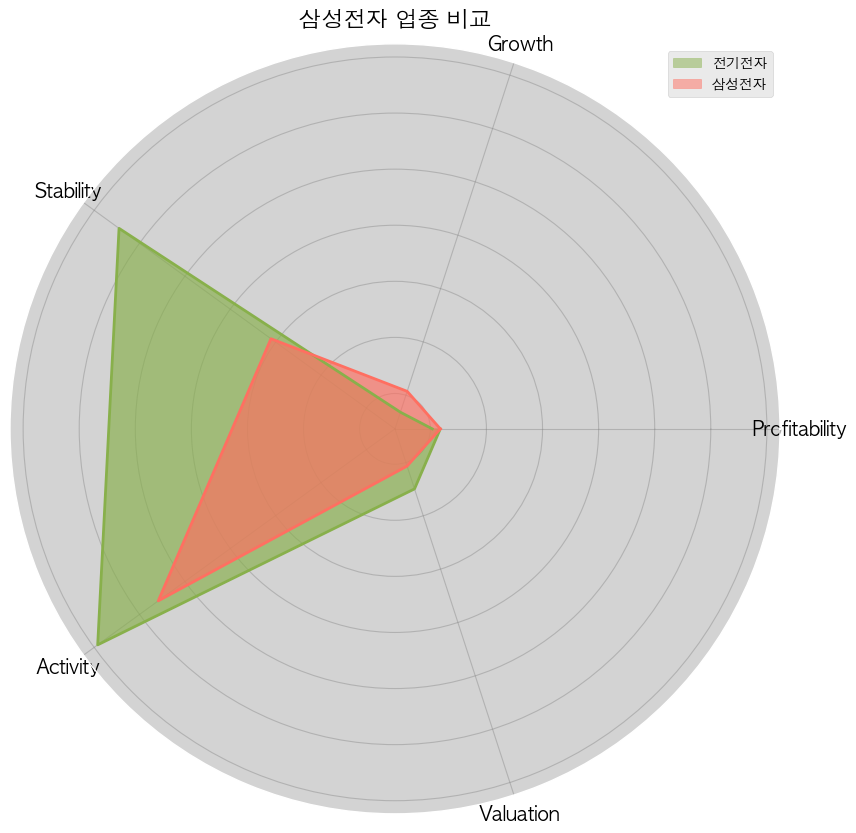

In [133]:
plot_radar('전기전자', '삼성전자', '삼성전자 업종 비교')

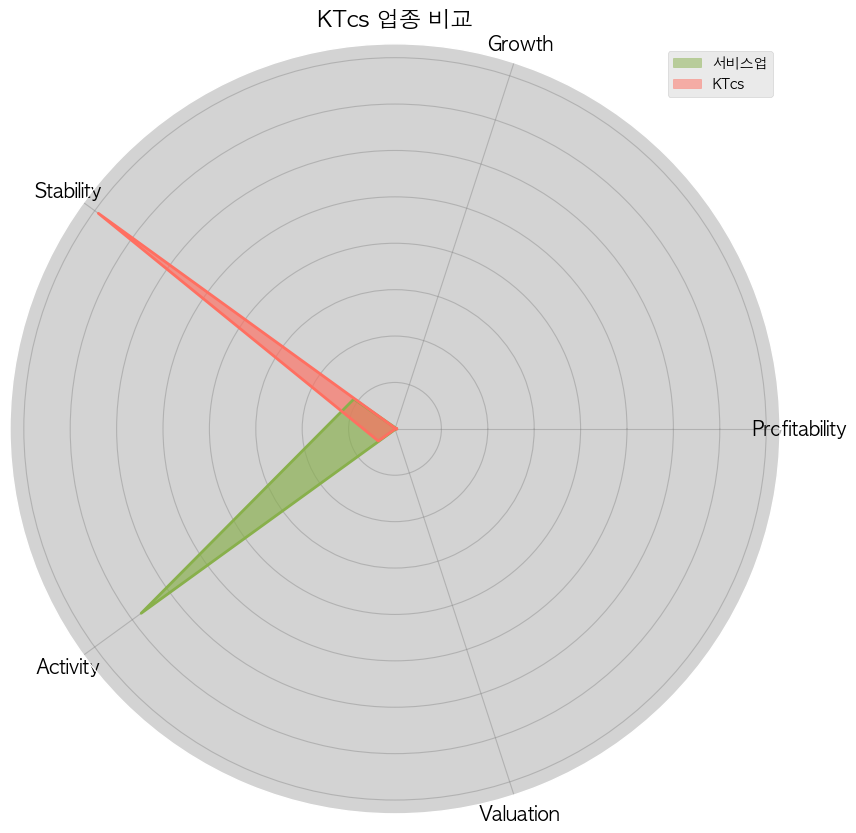

In [134]:
plot_radar('서비스업', 'KTcs', 'KTcs 업종 비교')

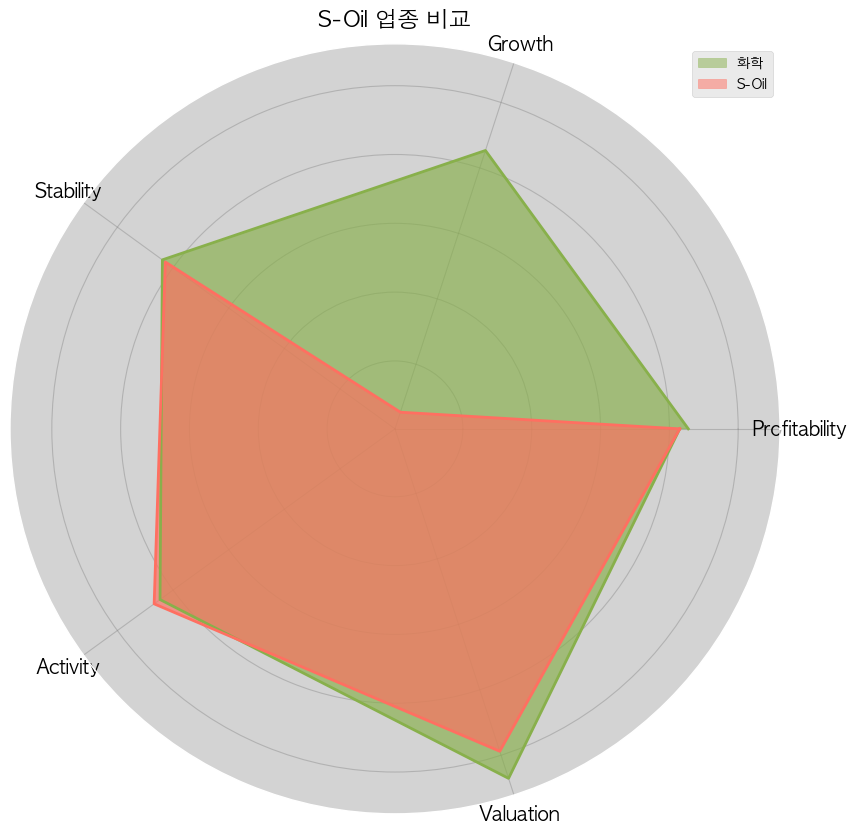

In [545]:
plot_radar('화학', 'S-Oil', 'S-Oil 업종 비교')

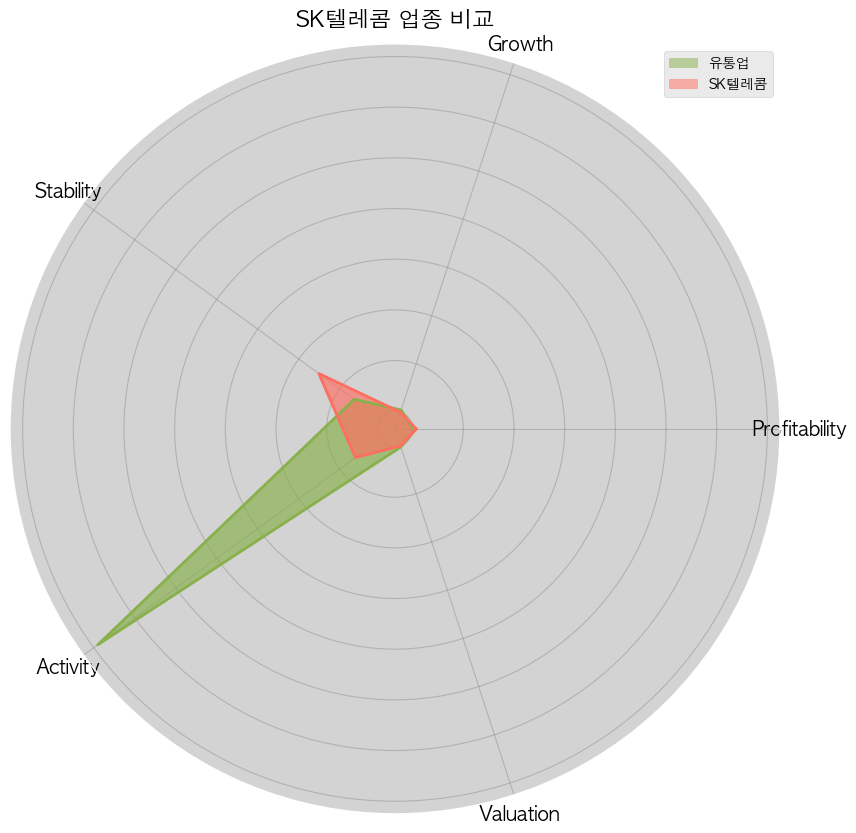

In [135]:
plot_radar('유통업', 'SK텔레콤', 'SK텔레콤 업종 비교')